In [2]:
import pandas as pd
import numpy as np
import re 
#import geopandas as gpd
import pandas as pd
import json
import datetime
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
#sns.set_theme(style="white")
import warnings
from sklearn.cluster import KMeans 
from sklearn.preprocessing import StandardScaler

warnings.filterwarnings("ignore")
from pandas_profiling import ProfileReport
import random
from sklearn import metrics 
from scipy.spatial.distance import cdist

In [3]:
budgets_fbi = pd.read_csv('CleanData/Merged_FBI_Budgets_Normalized.csv')
budgets_fbi.head()

,city_merge_name,population,city_population,year,violent_crime,property_crime,rev_total,police,education_services,education,educ_higher,educ_elem_sec,social_services,public_welfare,welfare_cash,welfare_vendors,welfare_other,correction,parks_recreation,housing_commdevt
0,"Anchorage, AK",260900,259348,2000,0.005841,0.043473,5523.35,352.61,2426.51,2386.40,0.0,2386.40,195.60,0.0,0.0,0.0,0.0,0.0,213.45,0.0
1,"Anchorage, AK",263588,260816,2001,0.006632,0.043500,4831.29,594.42,2281.82,2251.80,0.0,2251.80,138.03,0.0,0.0,0.0,0.0,0.0,266.67,0.0
2,"Anchorage, AK",267280,264274,2002,0.006439,0.044706,4914.64,708.42,2455.38,2426.06,0.0,2426.06,165.42,0.0,0.0,0.0,0.0,0.0,285.35,0.0
3,"Anchorage, AK",282940,268229,2003,0.006789,0.045483,4463.29,320.32,2590.59,2561.61,0.0,2561.61,176.95,0.0,0.0,0.0,0.0,0.0,121.36,0.0
4,"Anchorage, AK",286671,270568,2004,0.008062,0.038187,5007.39,325.37,2627.83,2599.76,0.0,2599.76,143.11,0.0,0.0,0.0,0.0,0.0,136.75,0.0


### Load the Income Data

In [4]:
income_data= pd.read_csv('CleanData/DPI_Clean.csv')
povertydf = pd.read_csv('CleanData/Demographics.csv')
racedf = pd.read_csv('CleanData/Race.csv')
racedf = racedf[racedf['geographic_area_name'].notnull()]


income_data.loc[income_data.loc[income_data['city'].str.contains('Fort Smith, AR')].index.values,'city'] = 'Ft. Smith, AR'
income_data.loc[income_data.loc[income_data['city'].str.contains('Boise City, ID')].index.values,'city'] = 'Boise, ID'
income_data.loc[income_data.loc[income_data['city'].str.contains('Louisville/Jefferson County, KY')].index.values,'city'] = 'Louisville, KY'

povertydf.loc[povertydf.loc[povertydf['city_name'].str.contains('Fort Smith, AR')].index.values,'city_name'] = 'Ft. Smith, AR'
povertydf.loc[povertydf.loc[povertydf['city_name'].str.contains('Boise City, ID')].index.values,'city_name'] = 'Boise, ID'
povertydf.loc[povertydf.loc[povertydf['city_name'].str.contains('Louisville/Jefferson County, KY')].index.values,'city_name'] = 'Louisville, KY'

racedf.loc[racedf.loc[racedf['geographic_area_name'].str.contains('Fort Smith, AR')].index.values,'geographic_area_name'] = 'Ft. Smith, AR'
racedf.loc[racedf.loc[racedf['geographic_area_name'].str.contains('Boise City, ID')].index.values,'geographic_area_name'] = 'Boise, ID'
racedf.loc[racedf.loc[racedf['geographic_area_name'].str.contains('Louisville/Jefferson County, KY')].index.values,'geographic_area_name'] = 'Louisville, KY'

In [5]:
merged_df = budgets_fbi.merge(income_data,left_on=['city_merge_name','year'],right_on = ['city','Year'],how='inner')
merged_df.city.unique().shape

(119,)

### Lost Cities

In [6]:
for i in budgets_fbi.city_merge_name.unique():
    if i not in merged_df.city.unique():
        print(i)

Oakland, CA
Wilmington, DE
Ft. Lauderdale, FL
St. Petersburg, FL
Ft. Wayne, IN
Gary, IN
Kansas City, KS
St. Paul, MN
Ft. Worth, TX
Norfolk, VA
Tacoma, WA


In [7]:
merged_df2 = merged_df.merge(povertydf,left_on=['city_merge_name','year'],right_on = ['city_name','Year'],how='inner')
merged_df2.city.unique().shape

(118,)

In [8]:
for i in merged_df.city_merge_name.unique():
    if i not in merged_df2.city.unique():
        print(i)

Boise, ID


In [9]:
merged_df3 = merged_df2.merge(racedf,left_on=['city_merge_name','year'],right_on = ['geographic_area_name','Year'],how='inner')
merged_df3 = merged_df3.T.drop_duplicates().T


merged_df3['percent_race_one_race_asian'] =merged_df3['percent_race_one_race_asian'].str.replace('N','0.0')
merged_df3['percent_race_one_race_black_or_african_american'] = merged_df3['percent_race_one_race_black_or_african_american'].str.replace('N','0.0')
merged_df3['percent_race_one_race_native_hawaiian_and_other_pacific_islander'] = merged_df3['percent_race_one_race_native_hawaiian_and_other_pacific_islander'].str.replace('N','0.0')
merged_df3['percent_race_one_race_white'] = merged_df3['percent_race_one_race_white'].str.replace('N','0.0')
merged_df3= merged_df3.drop(columns=['city_population'])
merged_df3.head()

,city_merge_name,population,year,violent_crime,property_crime,rev_total,police,education_services,education,educ_higher,...,total_estimate_mean_income_deficit_for_unrelated_individuals_(dollars),total_estimate_age_under_18_years,total_estimate_sex_male,total_estimate_age_65_years_and_over,percent_below_poverty_level_estimate_age_18_to_64_years,percent_race_one_race_asian,percent_race_one_race_black_or_african_american,percent_race_one_race_native_hawaiian_and_other_pacific_islander,percent_race_one_race_white,percent_hispanic_or_latino
0,"Anchorage, AK",313181,2010,0.008129,0.035063,6036.69,433.95,2880.31,2846.29,0.0,...,6609.0,100776,188590,26787,8.6,6.5,4.9,1.7,71.1,6.7
1,"Anchorage, AK",310965,2011,0.007892,0.03302,5815.54,410.66,2787.14,2755.34,0.0,...,6002.0,99826,188626,30084,7.5,6.5,4.3,1.6,70.8,6.9
2,"Anchorage, AK",313529,2012,0.008111,0.036182,5378.15,446.75,2429.79,2398.01,0.0,...,7493.0,99897,194906,31203,7.9,7.4,5.0,1.6,70.3,7.2
3,"Anchorage, AK",314553,2013,0.007938,0.041478,5694.68,454.03,2471.81,2439.77,0.0,...,6788.0,100002,196614,33232,7.2,6.5,4.8,1.7,69.8,7.6
4,"Anchorage, AK",316696,2014,0.008437,0.039514,5735.87,468.5,2456.47,2430.38,0.0,...,6674.0,99732,197075,35819,8.5,7.4,4.5,1.7,69.3,7.9


In [10]:
norm_column = "population_persons"


cols_to_normalize = ["personal_income_thousands_of_dollars",
"total_estimate_educational_attainment_population_25_years_and_over",
"total_estimate_age_18_to_64_years",
"total_estimate_employment_status_civilian_labor_force_16_years_and_over",
"total_estimate_population_for_whom_poverty_status_is_determined",
"total_estimate_age_65_years_and_over",
"total_estimate_sex_female",
"total_estimate_work_experience_population_16_years_and_over",
"total_estimate_age_under_18_years",
"total_estimate_sex_male",
"total_estimate_age_65_years_and_over"]


for i in cols_to_normalize:
    merged_df3[i] = merged_df3[i]/merged_df3["population_persons"]

In [11]:
merged_df3

,city_merge_name,population,year,violent_crime,property_crime,rev_total,police,education_services,education,educ_higher,...,total_estimate_mean_income_deficit_for_unrelated_individuals_(dollars),total_estimate_age_under_18_years,total_estimate_sex_male,total_estimate_age_65_years_and_over,percent_below_poverty_level_estimate_age_18_to_64_years,percent_race_one_race_asian,percent_race_one_race_black_or_african_american,percent_race_one_race_native_hawaiian_and_other_pacific_islander,percent_race_one_race_white,percent_hispanic_or_latino
0,"Anchorage, AK",313181,2010,0.008129,0.035063,6036.69,433.95,2880.31,2846.29,0.0,...,6609.0,0.263086,0.492334,0.0,8.6,6.5,4.9,1.7,71.1,6.7
1,"Anchorage, AK",310965,2011,0.007892,0.03302,5815.54,410.66,2787.14,2755.34,0.0,...,6002.0,0.257335,0.486247,0.0,7.5,6.5,4.3,1.6,70.8,6.9
2,"Anchorage, AK",313529,2012,0.008111,0.036182,5378.15,446.75,2429.79,2398.01,0.0,...,7493.0,0.254884,0.497295,0.0,7.9,7.4,5.0,1.6,70.3,7.2
3,"Anchorage, AK",314553,2013,0.007938,0.041478,5694.68,454.03,2471.81,2439.77,0.0,...,6788.0,0.25188,0.495222,0.0,7.2,6.5,4.8,1.7,69.8,7.6
4,"Anchorage, AK",316696,2014,0.008437,0.039514,5735.87,468.5,2456.47,2430.38,0.0,...,6674.0,0.250585,0.495168,0.0,8.5,7.4,4.5,1.7,69.3,7.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
873,"Cheyenne, WY",95635,2013,0.00207,0.027459,8445.96,339.58,2471.24,2401.25,0.0,...,5944.0,0.236075,0.492952,0.000001,9.7,1.8,3.4,0.0,88.0,14.1
874,"Cheyenne, WY",96236,2014,0.0016,0.024326,8430.56,359.75,2541.09,2481.71,0.0,...,5887.0,0.229789,0.483527,0.000001,11.8,1.0,3.3,0.0,84.9,14.3
875,"Cheyenne, WY",96943,2015,0.001774,0.025819,8849.32,470.45,2767.05,2703.34,0.0,...,5956.0,0.231115,0.487878,0.000001,11.0,1.2,2.5,0.2,88.7,14.5
876,"Cheyenne, WY",97275,2016,0.002519,0.030213,8710.69,504.08,2665.2,2599.29,0.0,...,5882.0,0.226884,0.496746,0.000001,9.8,1.2,2.7,0.4,90.6,14.6


In [12]:
dfoi = merged_df3[merged_df3.year==2017][merged_df3.columns[:9]].head(10)
dfoi 
profile = ProfileReport(dfoi)

In [13]:
def convert_to_numeric(df,col):
    try:
        df[col] = df[col].apply(float)
    except:
        print(col)
    
def convert_name_to_numeric(row):
    return name_dict[row]

def numeric_to_name(row):
    return label_dict[row]
    
    

### Create The Df for clustering

In [14]:
test= merged_df3.copy().dropna()
years= test.year
test = test.drop(columns='population')
test = test.drop(columns="population_persons")

for i in test.columns:
    convert_to_numeric(test,i)
test = test.drop(columns='year')
test

city_merge_name


,city_merge_name,violent_crime,property_crime,rev_total,police,education_services,education,educ_higher,educ_elem_sec,social_services,...,total_estimate_mean_income_deficit_for_unrelated_individuals_(dollars),total_estimate_age_under_18_years,total_estimate_sex_male,total_estimate_age_65_years_and_over,percent_below_poverty_level_estimate_age_18_to_64_years,percent_race_one_race_asian,percent_race_one_race_black_or_african_american,percent_race_one_race_native_hawaiian_and_other_pacific_islander,percent_race_one_race_white,percent_hispanic_or_latino
0,"Anchorage, AK",0.008129,0.035063,6036.69,433.95,2880.31,2846.29,0.0,2846.29,103.90,...,6609.0,0.263086,0.492334,1.825603e-07,8.6,6.5,4.9,1.7,71.1,6.7
1,"Anchorage, AK",0.007892,0.033020,5815.54,410.66,2787.14,2755.34,0.0,2755.34,93.42,...,6002.0,0.257335,0.486247,1.999156e-07,7.5,6.5,4.3,1.6,70.8,6.9
2,"Anchorage, AK",0.008111,0.036182,5378.15,446.75,2429.79,2398.01,0.0,2398.01,96.70,...,7493.0,0.254884,0.497295,2.031304e-07,7.9,7.4,5.0,1.6,70.3,7.2
3,"Anchorage, AK",0.007938,0.041478,5694.68,454.03,2471.81,2439.77,0.0,2439.77,128.83,...,6788.0,0.251880,0.495222,2.108275e-07,7.2,6.5,4.8,1.7,69.8,7.6
4,"Anchorage, AK",0.008437,0.039514,5735.87,468.50,2456.47,2430.38,0.0,2430.38,81.63,...,6674.0,0.250585,0.495168,2.261289e-07,8.5,7.4,4.5,1.7,69.3,7.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
873,"Cheyenne, WY",0.002070,0.027459,8445.96,339.58,2471.24,2401.25,0.0,2401.25,3678.48,...,5944.0,0.236075,0.492952,1.399698e-06,9.7,1.8,3.4,0.0,88.0,14.1
874,"Cheyenne, WY",0.001600,0.024326,8430.56,359.75,2541.09,2481.71,0.0,2481.71,3337.76,...,5887.0,0.229789,0.483527,1.472203e-06,11.8,1.0,3.3,0.0,84.9,14.3
875,"Cheyenne, WY",0.001774,0.025819,8849.32,470.45,2767.05,2703.34,0.0,2703.34,3448.83,...,5956.0,0.231115,0.487878,1.434651e-06,11.0,1.2,2.5,0.2,88.7,14.5
876,"Cheyenne, WY",0.002519,0.030213,8710.69,504.08,2665.20,2599.29,0.0,2599.29,3753.47,...,5882.0,0.226884,0.496746,1.491359e-06,9.8,1.2,2.7,0.4,90.6,14.6


## Create mappings between names and numerics so we can do clustering

In [15]:
name_dict = {}
label_dict = {}
for i,item in enumerate(merged_df3['city_merge_name'].unique()):
    name_dict[item] = i
    label_dict[i]=item
name_dict

{'Anchorage, AK': 0,
 'Fairbanks, AK': 1,
 'Birmingham, AL': 2,
 'Mobile, AL': 3,
 'Montgomery, AL': 4,
 'Ft. Smith, AR': 5,
 'Little Rock, AR': 6,
 'Phoenix, AZ': 7,
 'Tucson, AZ': 8,
 'Bakersfield, CA': 9,
 'Fresno, CA': 10,
 'Los Angeles, CA': 11,
 'Modesto, CA': 12,
 'Riverside, CA': 13,
 'Sacramento, CA': 14,
 'San Diego, CA': 15,
 'San Francisco, CA': 16,
 'San Jose, CA': 17,
 'Stockton, CA': 18,
 'Colorado Springs, CO': 19,
 'Denver, CO': 20,
 'Bridgeport, CT': 21,
 'Hartford, CT': 22,
 'New Haven, CT': 23,
 'Washington, DC': 24,
 'Dover, DE': 25,
 'Jacksonville, FL': 26,
 'Miami, FL': 27,
 'Orlando, FL': 28,
 'Tallahassee, FL': 29,
 'Tampa, FL': 30,
 'Atlanta, GA': 31,
 'Columbus, GA': 32,
 'Cedar Rapids, IA': 33,
 'Des Moines, IA': 34,
 'Chicago, IL': 35,
 'Indianapolis, IN': 36,
 'Topeka, KS': 37,
 'Wichita, KS': 38,
 'Lexington, KY': 39,
 'Louisville, KY': 40,
 'Baton Rouge, LA': 41,
 'New Orleans, LA': 42,
 'Shreveport, LA': 43,
 'Boston, MA': 44,
 'Springfield, MA': 45,
 '

In [16]:
test['city_merge_name'] = test['city_merge_name'].apply(convert_name_to_numeric)

distortions = [] 
inertias = []
mapping1 = {}
mapping2 = {} 
K = range(1,15) 

X = test.values[:,:]
X = np.nan_to_num(X)
#Normalize data
cluster_dataset = StandardScaler().fit_transform(X)
cluster_dataset

array([[-1.68559998,  2.2067123 ,  0.51518854, ...,  5.29925911,
        -0.30709506, -0.52068741],
       [-1.68559998,  2.07108669,  0.26610533, ...,  4.95647412,
        -0.33126239, -0.50839514],
       [-1.68559998,  2.19641162,  0.65161738, ...,  4.95647412,
        -0.37154127, -0.48995673],
       ...,
       [ 1.74821823, -1.42999978, -0.6118429 , ...,  0.15748424,
         1.11072164, -0.04128883],
       [ 1.74821823, -1.00366611, -0.07612501, ...,  0.84305422,
         1.2637814 , -0.0351427 ],
       [ 1.74821823, -0.75473302, -0.29314318, ..., -0.52808574,
         1.16711208, -0.02285043]])

1 : 5.70018975096815
2 : 5.3917719469910335
3 : 5.207612323944026
4 : 5.022429564912141
5 : 4.86531554414324
6 : 4.71384488978231
7 : 4.567426741173603
8 : 4.4444095011818705
9 : 4.36128900155292
10 : 4.272120188278592
11 : 4.165048844668325
12 : 4.092730057976754
13 : 4.042759597971033
14 : 3.981416756641281


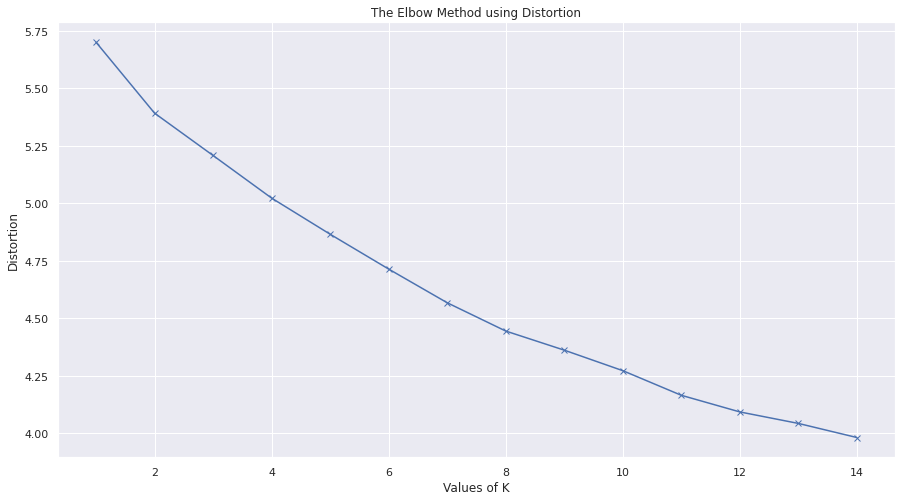

1 : 31239.00000000004
2 : 27775.765436503872
3 : 24608.998403928646
4 : 22668.826596544495
5 : 20986.39687085581
6 : 19731.354356718486
7 : 18572.566999370003
8 : 17623.39922724756
9 : 16770.34760619078
10 : 16048.430735282862
11 : 15303.482025309415
12 : 14737.444629248406
13 : 14227.209992852137
14 : 13820.664245459766


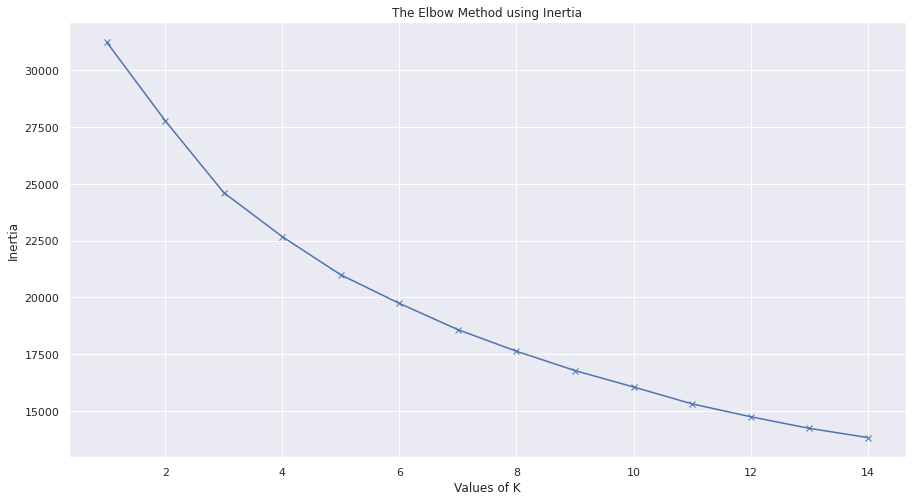

In [17]:
for k in K: 
    #Building and fitting the model 
    kmeanModel = KMeans(init="k-means++", n_clusters=k, n_init=50)
    kmeanModel.fit(cluster_dataset)     
      
    distortions.append(sum(np.min(cdist(cluster_dataset, kmeanModel.cluster_centers_, 
                      'euclidean'),axis=1)) / cluster_dataset.shape[0]) 
    inertias.append(kmeanModel.inertia_) 
  
    mapping1[k] = sum(np.min(cdist(cluster_dataset, kmeanModel.cluster_centers_, 
                 'euclidean'),axis=1)) / cluster_dataset.shape[0] 
    mapping2[k] = kmeanModel.inertia_ 
    
test['city_merge_name'] = test['city_merge_name'].apply(numeric_to_name)   
for key,val in mapping1.items(): 
    print(str(key)+' : '+str(val)) 
        
# Make Plot 1

plt.figure(figsize=(15,8))
plt.plot(K, distortions, 'bx-') 
plt.xlabel('Values of K') 
plt.ylabel('Distortion') 
plt.title('The Elbow Method using Distortion') 
plt.show() 
    
for key,val in mapping2.items(): 
    print(str(key)+' : '+str(val)) 
    
# Make Plot 2

plt.figure(figsize=(15,8))
plt.plot(K, inertias, 'bx-') 
plt.xlabel('Values of K') 
plt.ylabel('Inertia') 
plt.title('The Elbow Method using Inertia') 
plt.show()

In [18]:
num_clusters = 6
test['city_merge_name'] = test['city_merge_name'].apply(convert_name_to_numeric)
k_means = KMeans(init="k-means++", n_clusters=num_clusters, n_init=50,algorithm = "elkan")
k_means.fit(cluster_dataset)
labels = k_means.labels_

test['city_merge_name'] = test['city_merge_name'].apply(numeric_to_name)
test["Labels"] = labels
test['Year'] = years

In [19]:
modes = test.groupby(['city_merge_name','Labels']).count().reset_index().sort_values(by='violent_crime')
top_labels = modes[['city_merge_name','Labels','violent_crime']].groupby('city_merge_name').head(1)[['city_merge_name','Labels']]
labels = top_labels.sort_values('Labels')
summary = labels.groupby('Labels').head(10).rename(columns={"city_merge_name":"City","Labels":"Group"}).reset_index().drop(columns="index")
summary

,City,Group
0,"Richmond, VA",0
1,"Philadelphia, PA",0
2,"Seattle, WA",0
3,"Atlanta, GA",0
4,"New Haven, CT",0
5,"Tampa, FL",0
6,"Boston, MA",0
7,"Syracuse, NY",0
8,"Buffalo, NY",0
9,"Baltimore, MD",0


In [20]:
test[['city_merge_name','Labels']].groupby('city_merge_name').mean().head(15)

,Labels
city_merge_name,
"Akron, OH",1.571429
"Albuquerque, NM",5.000000
"Anchorage, AK",0.875000
"Atlanta, GA",3.125000
"Austin, TX",2.500000
"Bakersfield, CA",2.000000
"Baltimore, MD",0.000000
"Baton Rouge, LA",5.000000
"Billings, MT",1.000000


In [21]:
modes['city_merge_name'].unique().shape

(118,)

In [22]:
def apply_labels(row):
    item = labels['Labels'][labels.city_merge_name==row].values[0]
    return item

In [23]:
test['Group']=test['city_merge_name'].apply(apply_labels)

In [24]:
res= test.groupby('Group').median().reset_index()
res.sort_values(by='violent_crime',ascending=False)

,Group,violent_crime,property_crime,rev_total,police,education_services,education,educ_higher,educ_elem_sec,social_services,...,total_estimate_age_under_18_years,total_estimate_sex_male,total_estimate_age_65_years_and_over,percent_below_poverty_level_estimate_age_18_to_64_years,percent_race_one_race_asian,percent_race_one_race_black_or_african_american,percent_race_one_race_native_hawaiian_and_other_pacific_islander,percent_race_one_race_white,percent_hispanic_or_latino,Labels
2,2,0.005173,0.032336,6505.840,376.310,2021.850,1998.850,0.00,1998.850,1036.950,...,0.278095,0.485093,1.279332e-07,19.10,5.5,5.10,0.2,72.6,50.9,2
5,5,0.005136,0.035284,5772.505,385.880,1506.530,1468.585,0.00,1460.935,253.265,...,0.231251,0.476224,1.748417e-07,15.40,2.2,17.70,0.0,72.7,7.8,5
3,3,0.004044,0.029810,5159.220,331.510,1604.710,1576.200,0.00,1455.380,84.060,...,0.211509,0.444798,1.699628e-07,15.30,2.4,14.00,0.0,78.1,6.7,3
0,0,0.003447,0.025038,7681.220,477.135,2123.125,2071.710,0.00,2071.710,566.700,...,0.222743,0.476589,6.110867e-08,11.75,5.0,10.80,0.0,73.3,10.6,0
4,4,0.003276,0.021403,20394.970,945.235,4327.615,4202.810,270.63,3933.480,6336.805,...,0.229669,0.478330,1.827708e-08,7.75,9.7,25.35,0.1,55.7,14.9,4
1,1,0.003275,0.028983,5040.680,297.690,1658.050,1617.940,0.00,1596.790,190.910,...,0.230198,0.481038,2.039821e-07,12.20,2.3,4.60,0.0,85.0,5.9,1


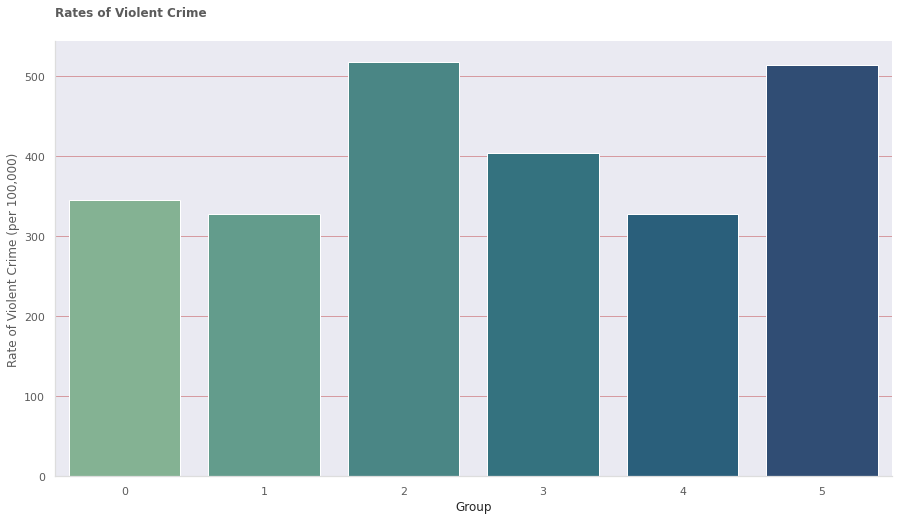

In [25]:
crime = res.copy()
crime[["violent_crime","property_crime"]] = crime[["violent_crime","property_crime"]]*(10**5)
plt.figure(figsize=(15,8))
ax = sns.barplot(data=crime,x='Group',y='violent_crime',palette="crest")
ax.spines['bottom'].set_color('#dddddd')
ax.spines['left'].set_color('#dddddd')
sns.despine(left=False, bottom=False, right=True)
ax.tick_params(direction='out', length=6, width=2, colors="#5B5B5B",
               grid_color='r', grid_alpha=0.5)
_ = ax.set_title('Rates of Violent Crime', color='#5B5B5B',loc='left',pad=25.0,fontweight="bold")
_ = ax.set_ylabel('Rate of Violent Crime (per 100,000)',color='#5B5B5B')

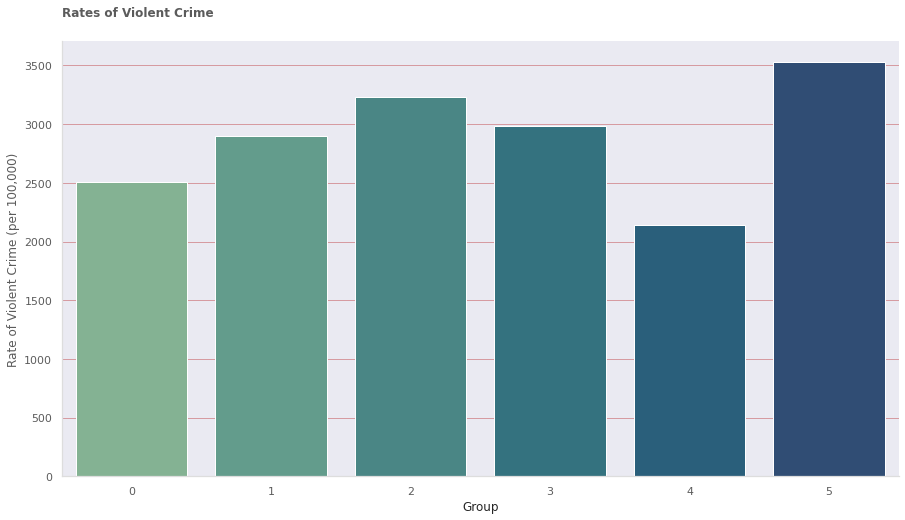

In [26]:
crime = res.copy()
crime[["violent_crime","property_crime"]] = crime[["violent_crime","property_crime"]]*(10**5)
plt.figure(figsize=(15,8))
ax = sns.barplot(data=crime,x='Group',y='property_crime',palette="crest")
ax.spines['bottom'].set_color('#dddddd')
ax.spines['left'].set_color('#dddddd')
sns.despine(left=False, bottom=False, right=True)
ax.tick_params(direction='out', length=6, width=2, colors="#5B5B5B",
               grid_color='r', grid_alpha=0.5)
_ = ax.set_title('Rates of Violent Crime', color='#5B5B5B',loc='left',pad=25.0,fontweight="bold")
_ = ax.set_ylabel('Rate of Violent Crime (per 100,000)',color='#5B5B5B')

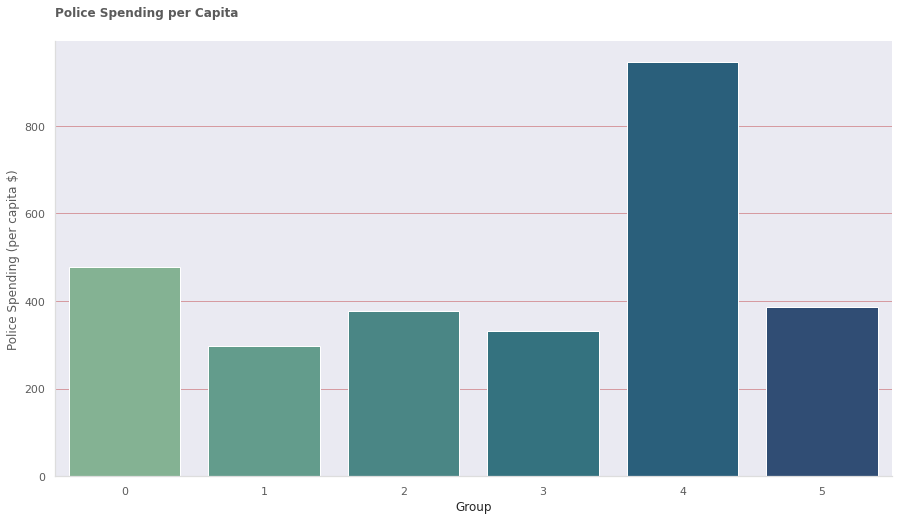

In [27]:
plt.figure(figsize=(15,8))
ax = sns.barplot(data=res,x='Group',y='police',palette="crest")
ax.spines['bottom'].set_color('#dddddd')
ax.spines['left'].set_color('#dddddd')
sns.despine(left=False, bottom=False, right=True)
ax.tick_params(direction='out', length=6, width=2, colors="#5B5B5B",
               grid_color='r', grid_alpha=0.5)
_ = ax.set_title('Police Spending per Capita', color='#5B5B5B',loc='left',pad=25.0,fontweight="bold")
_ = ax.set_ylabel('Police Spending (per capita $)',color='#5B5B5B')

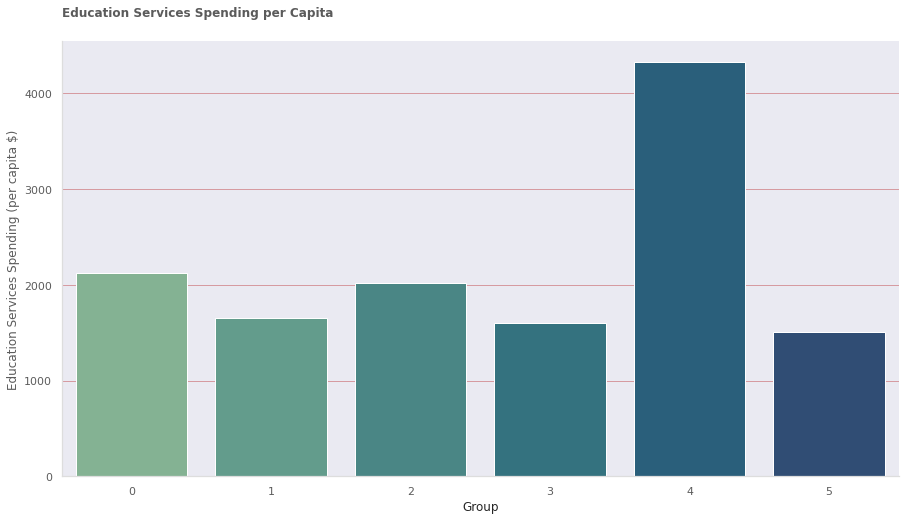

In [28]:
plt.figure(figsize=(15,8))
ax = sns.barplot(data=res,x='Group',y='education_services',palette="crest")
ax.spines['bottom'].set_color('#dddddd')
ax.spines['left'].set_color('#dddddd')
sns.despine(left=False, bottom=False, right=True)
ax.tick_params(direction='out', length=6, width=2, colors="#5B5B5B",
               grid_color='r', grid_alpha=0.5)
_ = ax.set_title('Education Services Spending per Capita', color='#5B5B5B',loc='left',pad=25.0,fontweight="bold")
_ = ax.set_ylabel('Education Services Spending (per capita $)',color='#5B5B5B')

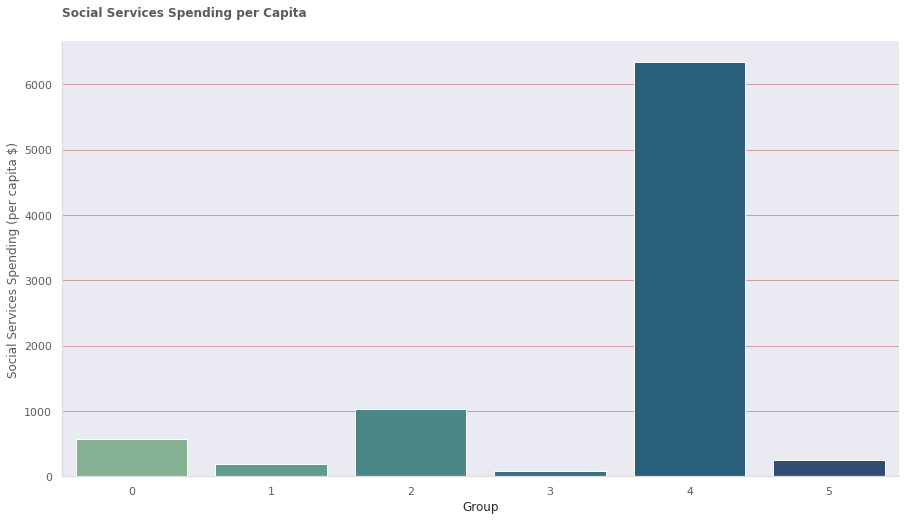

In [29]:
plt.figure(figsize=(15,8))
ax = sns.barplot(data=res,x='Group',y='social_services',palette="crest")
ax.spines['bottom'].set_color('#dddddd')
ax.spines['left'].set_color('#dddddd')
sns.despine(left=False, bottom=False, right=True)
ax.tick_params(direction='out', length=6, width=2, colors="#5B5B5B",
               grid_color='r', grid_alpha=0.5)
_ = ax.set_title('Social Services Spending per Capita', color='#5B5B5B',loc='left',pad=25.0,fontweight="bold")
_ = ax.set_ylabel('Social Services Spending (per capita $)',color='#5B5B5B')

### Let's Look at Trends

In [30]:
res= test.groupby(['Year','Group']).median().reset_index().sort_values(by=['Year','violent_crime'],ascending=[True,False])
res['Year'] = pd.to_datetime(res['Year'],format="%Y")

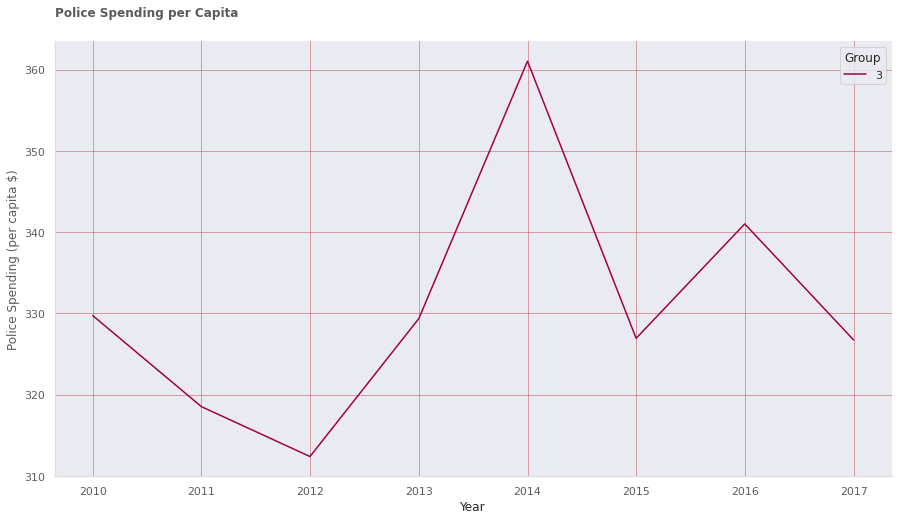

In [31]:
plt.figure(figsize=(15,8))
ax = sns.lineplot(data=res[res.Group==3],x='Year',y='police',palette="Spectral",hue="Group")
ax.spines['bottom'].set_color('#dddddd')
ax.spines['left'].set_color('#dddddd')
sns.despine(left=False, bottom=False, right=True)
sns.despine(left=False, bottom=False, right=True)
ax.tick_params(direction='out', length=6, width=2, colors="#5B5B5B",
               grid_color='r', grid_alpha=0.5)
_ = ax.set_title('Police Spending per Capita', color='#5B5B5B',loc='left',pad=25.0,fontweight="bold")
_ = ax.set_ylabel('Police Spending (per capita $)',color='#5B5B5B')

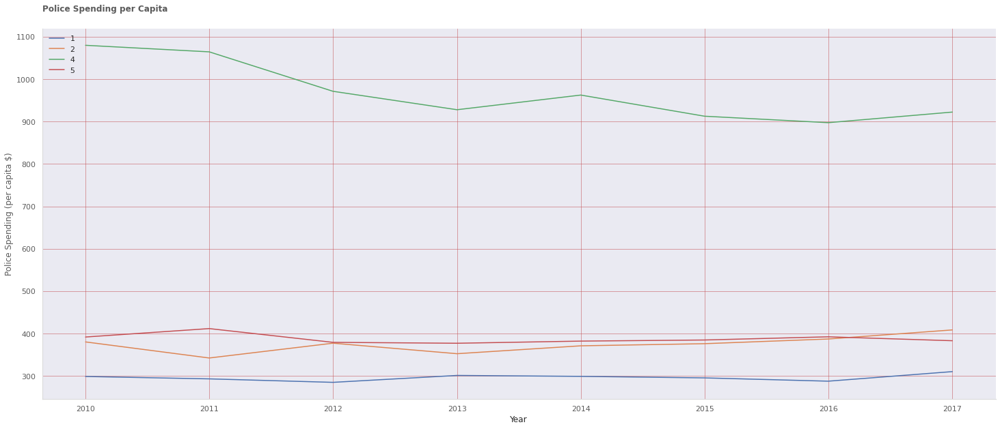

In [32]:
plt.figure(figsize=(25,10))
ax = sns.lineplot(data=res[res.Group.isin([1,2,4,5])],x='Year',y='police',palette="deep",hue="Group")
ax.spines['bottom'].set_color('#dddddd')
ax.spines['left'].set_color('#dddddd')
sns.despine(left=False, bottom=False, right=True)
sns.despine(left=False, bottom=False, right=True)
ax.tick_params(direction='out', length=6, width=2, colors="#5B5B5B",
               grid_color='r', grid_alpha=0.5)
_ = ax.set_title('Police Spending per Capita', color='#5B5B5B',loc='left',pad=25.0,fontweight="bold")
_ = ax.set_ylabel('Police Spending (per capita $)',color='#5B5B5B')
_= plt.legend(loc = 'upper left',frameon=False)

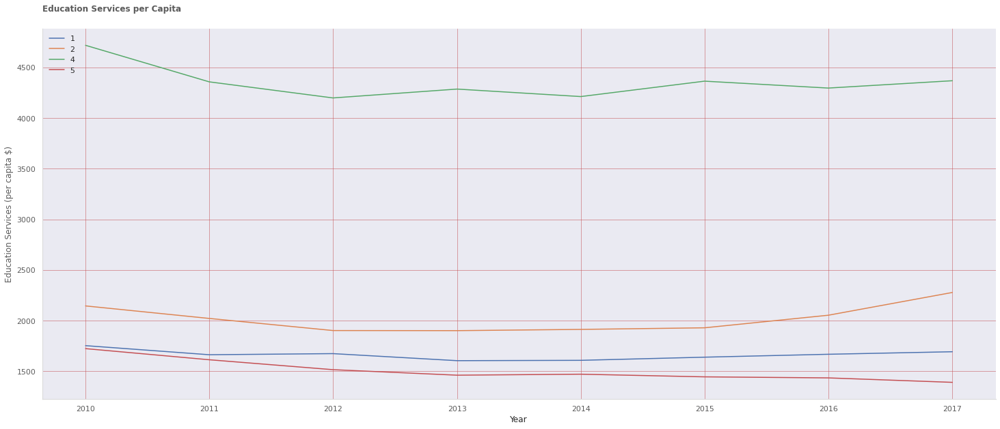

In [33]:
plt.figure(figsize=(25,10))
ax = sns.lineplot(data=res[res.Group.isin([1,2,4,5])],x='Year',y='education_services',palette="deep",hue="Group")
ax.spines['bottom'].set_color('#dddddd')
ax.spines['left'].set_color('#dddddd')
sns.despine(left=False, bottom=False, right=True)
sns.despine(left=False, bottom=False, right=True)
ax.tick_params(direction='out', length=6, width=2, colors="#5B5B5B",
               grid_color='r', grid_alpha=0.5)
_ = ax.set_title('Education Services per Capita', color='#5B5B5B',loc='left',pad=25.0,fontweight="bold")
_ = ax.set_ylabel('Education Services (per capita $)',color='#5B5B5B')
_= plt.legend(loc = 'upper left',frameon=False)

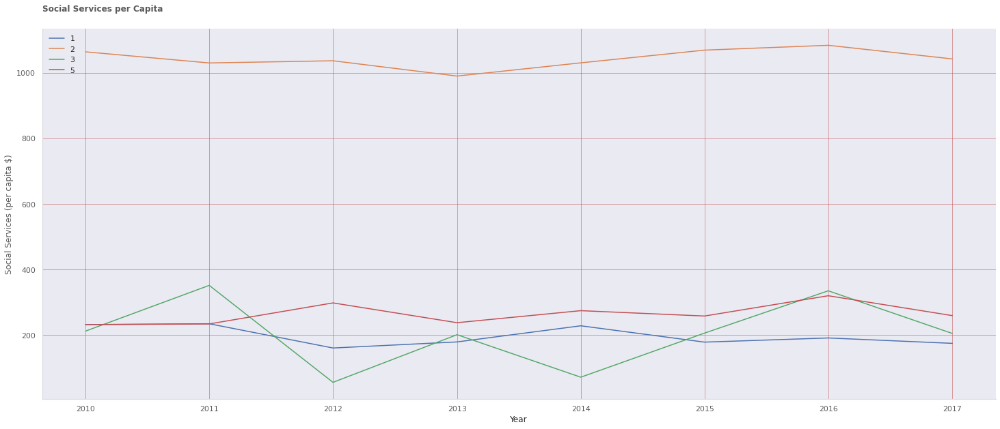

In [34]:
plt.figure(figsize=(25,10))
ax = sns.lineplot(data=res[res.Group.isin([1,2,3,5])],x='Year',y='social_services',palette="deep",hue="Group")
ax.spines['bottom'].set_color('#dddddd')
ax.spines['left'].set_color('#dddddd')
sns.despine(left=False, bottom=False, right=True)
sns.despine(left=False, bottom=False, right=True)
ax.tick_params(direction='out', length=6, width=2, colors="#5B5B5B",
               grid_color='r', grid_alpha=0.5)
_ = ax.set_title('Social Services per Capita', color='#5B5B5B',loc='left',pad=25.0,fontweight="bold")
_ = ax.set_ylabel('Social Services (per capita $)',color='#5B5B5B')
_= plt.legend(loc = 'upper left',frameon=False)

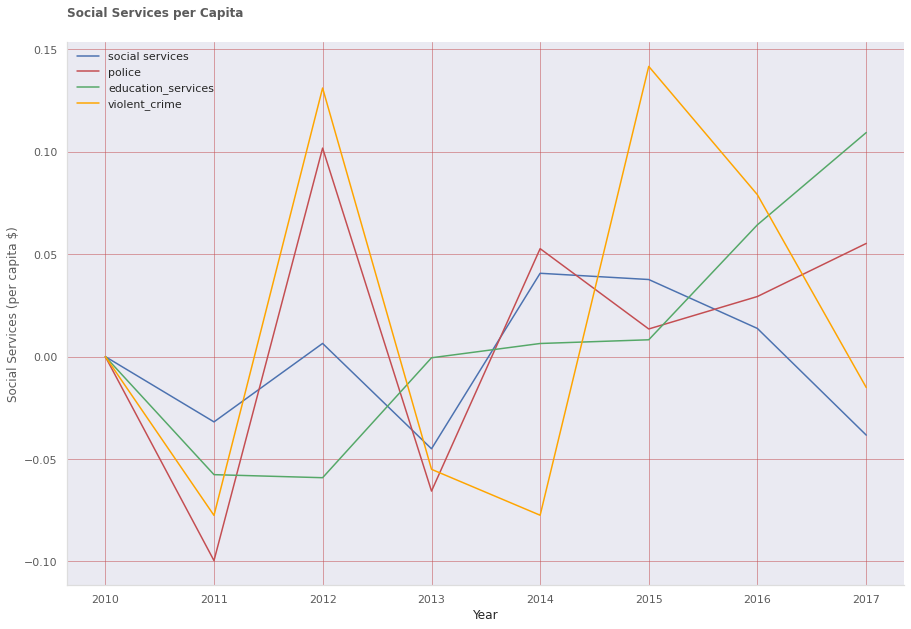

In [35]:
pct_changes = res[res.Group==2].copy()
pct_changes['police'] = pct_changes['police'].pct_change().fillna(0.0)
pct_changes['social_services'] = pct_changes['social_services'].pct_change().fillna(0.0)
pct_changes['education_services'] = pct_changes['education_services'].pct_change().fillna(0.0)
pct_changes['violent_crime'] = pct_changes['violent_crime'].pct_change().fillna(0.0)
pct_changes

plt.figure(figsize=(15,10))
ax = sns.lineplot(data=pct_changes,x='Year',y='social_services',palette="deep")
sns.lineplot(data=pct_changes,ax=ax,x='Year',y='police',color='r',palette="deep")
sns.lineplot(data=pct_changes,ax=ax,x='Year',y='education_services',color='g',palette="deep")
sns.lineplot(data=pct_changes,ax=ax,x='Year',y='violent_crime',color='orange',palette="deep")
ax.spines['bottom'].set_color('#dddddd')
ax.spines['left'].set_color('#dddddd')
sns.despine(left=False, bottom=False, right=True)
sns.despine(left=False, bottom=False, right=True)
ax.tick_params(direction='out', length=6, width=2, colors="#5B5B5B",
               grid_color='r', grid_alpha=0.5)
_ = ax.set_title('Social Services per Capita', color='#5B5B5B',loc='left',pad=25.0,fontweight="bold")
_ = ax.set_ylabel('Social Services (per capita $)',color='#5B5B5B')
_= plt.legend(labels = ['social services','police','education_services','violent_crime'],loc = 'upper left',frameon=False)

### Highest Crime Cities

Highest Crime Group: 2


<AxesSubplot:>

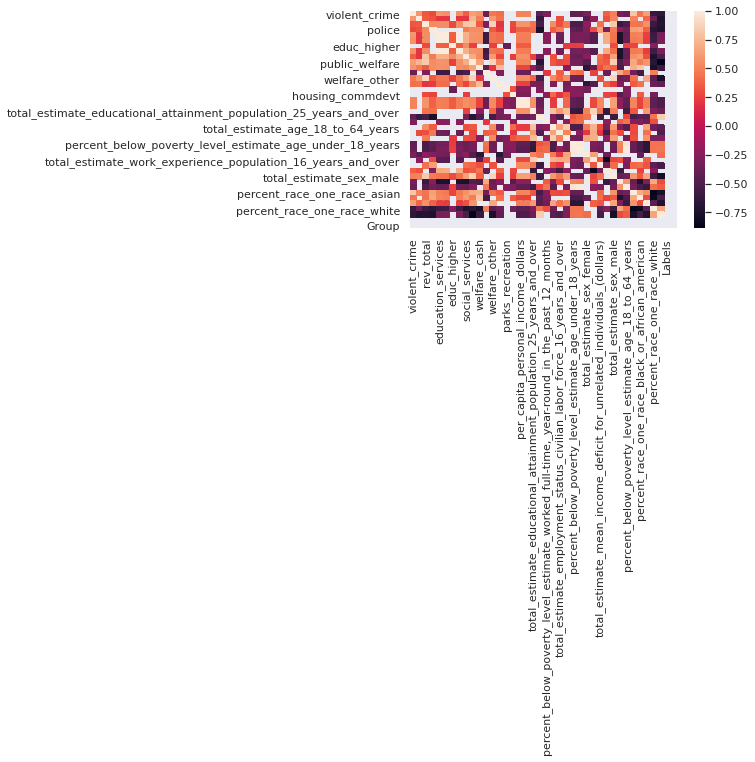

In [36]:
bygroup = res.sort_values(by='violent_crime',ascending=False)
highest_crime = int(bygroup.reset_index().loc[0]['Group'])
print("Highest Crime Group:",highest_crime)
corrs = test[test.Labels==highest_crime].corr()
sns.heatmap(corrs[abs(corrs)>0.2])

In [36]:
ProfileReport(test[test.Group==highest_crime][list(test.columns[:5])+list(test.columns[17:18])+list(test.columns[23:34])])

Summarize dataset:   0%|          | 0/31 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Lowest Crime Cities

In [79]:
lowest_crime = int(bygroup.reset_index().loc[bygroup.shape[0]-2]['Group'])
lowest_crime

2

In [80]:
test[test.Group==lowest_crime][list(test.columns[:5])+list(test.columns[17:18])+list(test.columns[23:34])+['total_estimate_mean_income_deficit_for_unrelated_individuals_(dollars)']].corr()

,violent_crime,property_crime,rev_total,police,per_capita_personal_income_dollars,total_estimate_employment_status_civilian_labor_force_16_years_and_over,total_estimate_population_for_whom_poverty_status_is_determined,percent_below_poverty_level_estimate_age_under_18_years,percent_below_poverty_level_estimate_population_for_whom_poverty_status_is_determined,total_estimate_sex_female,total_estimate_work_experience_population_16_years_and_over,total_estimate_mean_income_deficit_for_unrelated_individuals_(dollars),total_estimate_age_under_18_years,total_estimate_sex_male,total_estimate_age_65_years_and_over,percent_below_poverty_level_estimate_age_18_to_64_years,total_estimate_mean_income_deficit_for_unrelated_individuals_(dollars)
violent_crime,1.000000,0.613812,0.017760,0.199866,0.343181,0.071082,0.106019,-0.092125,-0.180655,-0.313655,0.085648,0.050521,-0.031826,0.450772,0.070929,-0.218637,0.050521
property_crime,0.613812,1.000000,0.097892,0.189368,-0.129839,-0.242718,-0.119292,0.146751,0.088231,-0.322603,-0.194641,-0.016255,0.112116,0.122682,0.010650,0.022656,-0.016255
rev_total,0.017760,0.097892,1.000000,0.510910,0.354109,0.033679,0.135995,-0.085777,-0.259091,0.109324,0.128796,0.058711,-0.017150,0.101129,-0.098982,-0.319517,0.058711
police,0.199866,0.189368,0.510910,1.000000,0.307955,0.150920,0.176201,0.016774,-0.074882,0.159903,0.294244,0.166575,-0.164872,0.114002,-0.177628,-0.122549,0.166575
per_capita_personal_income_dollars,0.343181,-0.129839,0.354109,0.307955,1.000000,0.574032,0.072500,-0.557518,-0.698441,-0.087237,0.367275,0.175835,-0.351818,0.189600,-0.051296,-0.669756,0.175835
total_estimate_employment_status_civilian_labor_force_16_years_and_over,0.071082,-0.242718,0.033679,0.150920,0.574032,1.000000,0.168020,-0.291681,-0.295181,0.168799,0.544182,-0.149314,-0.484200,0.093490,0.009633,-0.255609,-0.149314
total_estimate_population_for_whom_poverty_status_is_determined,0.106019,-0.119292,0.135995,0.176201,0.072500,0.168020,1.000000,0.092913,0.066001,0.753809,0.476227,0.118306,0.260125,0.790314,0.058316,0.020213,0.118306
percent_below_poverty_level_estimate_age_under_18_years,-0.092125,0.146751,-0.085777,0.016774,-0.557518,-0.291681,0.092913,1.000000,0.854410,0.318689,0.120081,-0.061655,-0.050659,-0.158422,-0.006020,0.655800,-0.061655
percent_below_poverty_level_estimate_population_for_whom_poverty_status_is_determined,-0.180655,0.088231,-0.259091,-0.074882,-0.698441,-0.295181,0.066001,0.854410,1.000000,0.237670,0.050994,0.011107,-0.005565,-0.123061,-0.009040,0.945733,0.011107
total_estimate_sex_female,-0.313655,-0.322603,0.109324,0.159903,-0.087237,0.168799,0.753809,0.318689,0.237670,1.000000,0.509251,0.047038,0.045817,0.193142,-0.061001,0.144745,0.047038


### Strongest Positive Correlations

In [37]:
violent_crime = test.groupby('Labels').median().corr()['violent_crime']
strongest_positive = list(violent_crime[violent_crime>0.50].index)
strongest_positive

['violent_crime',
 'property_crime',
 'percent_below_poverty_level_estimate_age_65_years_and_over',
 'percent_below_poverty_level_estimate_worked_full-time,_year-round_in_the_past_12_months',
 'percent_below_poverty_level_estimate_age_under_18_years',
 'percent_below_poverty_level_estimate_population_for_whom_poverty_status_is_determined',
 'percent_below_poverty_level_estimate_age_18_to_64_years']

### Strongest Negative Correlations

In [38]:
violent_crime = test.groupby('Labels').median().corr()['violent_crime']
strongest_negative = list(violent_crime[violent_crime<-0.50].index)
strongest_negative

['housing_commdevt',
 'per_capita_personal_income_dollars',
 'personal_income_thousands_of_dollars',
 'total_estimate_educational_attainment_population_25_years_and_over',
 'total_estimate_employment_status_civilian_labor_force_16_years_and_over']

In [39]:
test.corr()

,violent_crime,property_crime,rev_total,police,education_services,education,educ_higher,educ_elem_sec,social_services,public_welfare,...,total_estimate_sex_male,total_estimate_age_65_years_and_over,percent_below_poverty_level_estimate_age_18_to_64_years,percent_race_one_race_asian,percent_race_one_race_black_or_african_american,percent_race_one_race_native_hawaiian_and_other_pacific_islander,percent_race_one_race_white,percent_hispanic_or_latino,Labels,Group
violent_crime,1.000000,0.504558,0.040654,0.151139,-0.082665,-0.077439,-0.143767,-0.068313,0.010782,-0.089365,...,0.012721,-0.209692,0.258096,0.040885,0.332232,0.155468,-0.397123,0.163201,-0.416400,-0.396698
property_crime,0.504558,1.000000,-0.175998,-0.101946,-0.223802,-0.225287,-0.199461,-0.217228,-0.067049,-0.181555,...,-0.088107,-0.005513,0.368339,-0.158733,0.213716,0.173096,-0.167134,0.065679,-0.201760,-0.145138
rev_total,0.040654,-0.175998,1.000000,0.614974,0.405987,0.396635,0.332481,0.384027,0.725488,0.687200,...,-0.012184,-0.286146,-0.184725,0.424479,0.128888,0.040055,-0.312987,0.065442,-0.175870,-0.159659
police,0.151139,-0.101946,0.614974,1.000000,0.287833,0.277034,0.234410,0.268043,0.268120,0.453404,...,-0.032915,-0.325071,-0.138469,0.239795,0.257093,-0.026525,-0.341693,0.070806,-0.310716,-0.327515
education_services,-0.082665,-0.223802,0.405987,0.287833,1.000000,0.998860,0.498011,0.995785,0.230730,0.438052,...,-0.040203,-0.052942,-0.247945,0.074281,-0.016892,-0.072316,-0.081810,0.003265,0.016956,-0.042753
education,-0.077439,-0.225287,0.396635,0.277034,0.998860,1.000000,0.494135,0.997297,0.226834,0.427060,...,-0.040585,-0.051175,-0.237326,0.068785,-0.017432,-0.075584,-0.082913,0.016378,0.015191,-0.045001
educ_higher,-0.143767,-0.199461,0.332481,0.234410,0.498011,0.494135,1.000000,0.428917,0.293276,0.502577,...,-0.084034,-0.088975,-0.110609,0.028426,0.088695,-0.123566,-0.045550,-0.103269,-0.005720,0.018918
educ_elem_sec,-0.068313,-0.217228,0.384027,0.268043,0.995785,0.997297,0.428917,1.000000,0.210907,0.401264,...,-0.035067,-0.045654,-0.237248,0.069069,-0.025609,-0.068092,-0.082301,0.025746,0.016268,-0.048357
social_services,0.010782,-0.067049,0.725488,0.268120,0.230730,0.226834,0.293276,0.210907,1.000000,0.624102,...,-0.076967,-0.073797,-0.016988,0.295387,0.081690,-0.004165,-0.218419,0.096844,-0.065390,-0.010738
public_welfare,-0.089365,-0.181555,0.687200,0.453404,0.438052,0.427060,0.502577,0.401264,0.624102,1.000000,...,0.028602,-0.167314,-0.152445,0.309315,0.056882,0.028069,-0.220511,0.079663,0.036359,0.026657


In [40]:
property_crime = test.groupby('Labels').mean().corr()['property_crime']
property_crime.sort_values()[abs(property_crime.sort_values())>0.75]

per_capita_personal_income_dollars                                                        -0.952433
personal_income_thousands_of_dollars                                                      -0.952432
total_estimate_employment_status_civilian_labor_force_16_years_and_over                   -0.892665
percent_race_one_race_asian                                                               -0.861298
educ_elem_sec                                                                             -0.823765
education_services                                                                        -0.820821
education                                                                                 -0.819583
housing_commdevt                                                                          -0.810481
welfare_cash                                                                              -0.804059
police                                                                                    -0.785258


In [41]:
property_crime = test.groupby('Labels').median().corr()['property_crime']
property_crime.sort_values()[abs(property_crime.sort_values())>0.75]

per_capita_personal_income_dollars                                                      -0.942021
personal_income_thousands_of_dollars                                                    -0.942017
total_estimate_employment_status_civilian_labor_force_16_years_and_over                 -0.908782
percent_race_one_race_asian                                                             -0.843123
welfare_cash                                                                            -0.814476
total_estimate_educational_attainment_population_25_years_and_over                      -0.802453
total_estimate_age_18_to_64_years                                                       -0.784056
educ_elem_sec                                                                           -0.775903
education_services                                                                      -0.763659
housing_commdevt                                                                        -0.763015
education           

In [42]:
violent_crime = test.groupby('Labels').median().corr()['violent_crime']
violent_crime.sort_values()[abs(violent_crime.sort_values())>0.75]

percent_below_poverty_level_estimate_worked_full-time,_year-round_in_the_past_12_months    0.760821
property_crime                                                                             0.776158
percent_below_poverty_level_estimate_age_18_to_64_years                                    0.828167
percent_below_poverty_level_estimate_population_for_whom_poverty_status_is_determined      0.851317
percent_below_poverty_level_estimate_age_65_years_and_over                                 0.862024
percent_below_poverty_level_estimate_age_under_18_years                                    0.872334
violent_crime                                                                              1.000000
Name: violent_crime, dtype: float64

In [43]:
violent_crime = test.groupby('Labels').mean().corr()['violent_crime']
violent_crime.sort_values()[abs(violent_crime.sort_values())>0.70]

Group                                                                                   -0.756083
property_crime                                                                           0.753510
percent_below_poverty_level_estimate_age_18_to_64_years                                  0.827899
percent_below_poverty_level_estimate_age_65_years_and_over                               0.834413
percent_below_poverty_level_estimate_population_for_whom_poverty_status_is_determined    0.841893
percent_below_poverty_level_estimate_age_under_18_years                                  0.871998
violent_crime                                                                            1.000000
Name: violent_crime, dtype: float64

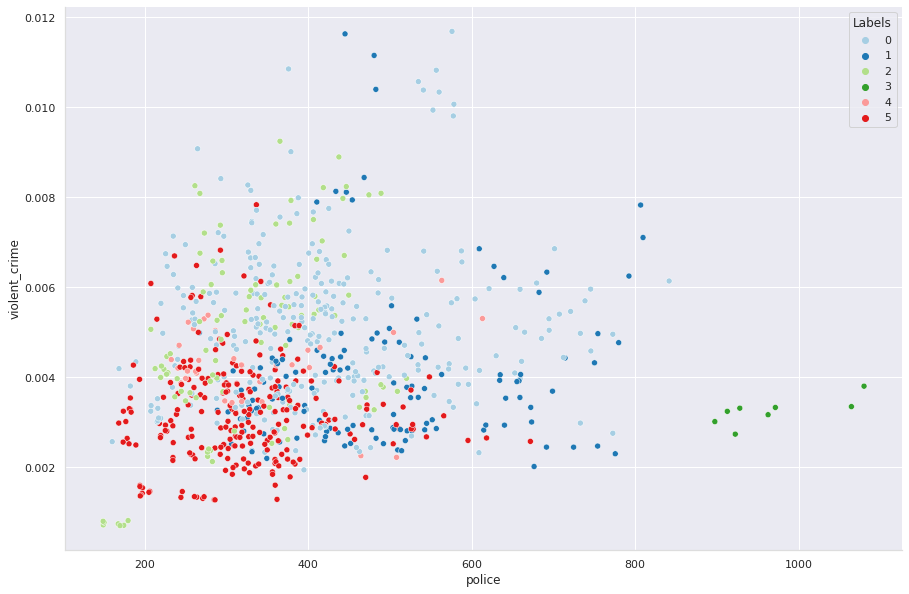

In [44]:
plt.figure(figsize=(15,10))
var = 'percent_below_poverty_level_estimate_age_under_18_years'
var = 'police'
vcrime = test[[var,'violent_crime','Labels']]
ax =sns.scatterplot(data= vcrime,x=var,y='violent_crime',hue='Labels',palette="Paired")
ax.spines['bottom'].set_color('#dddddd')
ax.spines['left'].set_color('#dddddd')
sns.despine(left=False, bottom=False, right=True)
sns.despine(left=False, bottom=False, right=True)

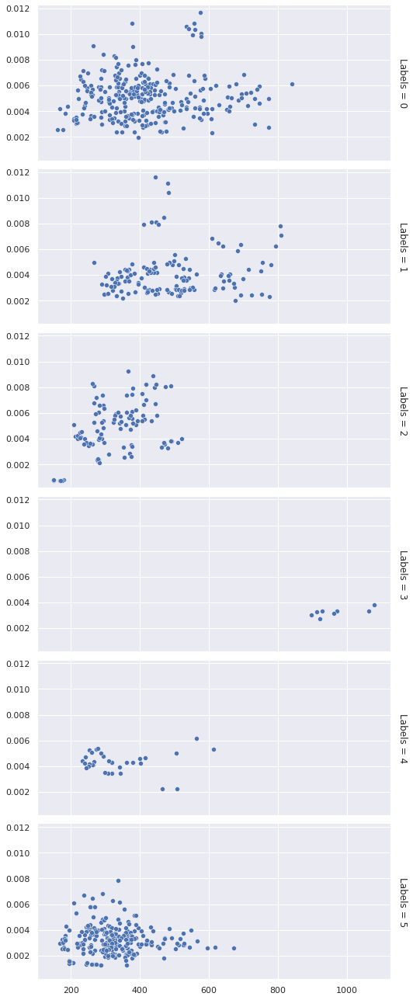

In [45]:
g = sns.FacetGrid(test,row="Labels",aspect=2.5, margin_titles=True)
_= g.map_dataframe(sns.scatterplot, x=var, y="violent_crime")

In [46]:
violent_crime = test.groupby('Labels').median().corr()['violent_crime']
strongest_negative = list(violent_crime[violent_crime<-0.50].index)
strongest_negative

['welfare_cash',
 'welfare_other',
 'housing_commdevt',
 'per_capita_personal_income_dollars',
 'personal_income_thousands_of_dollars',
 'total_estimate_employment_status_civilian_labor_force_16_years_and_over',
 'percent_race_one_race_asian',
 'Group']

In [47]:
test.groupby('Labels').median().corr()['Group'].sort_values()

violent_crime                                                                             -0.632482
total_estimate_sex_female                                                                 -0.490992
percent_below_poverty_level_estimate_age_65_years_and_over                                -0.428188
total_estimate_population_for_whom_poverty_status_is_determined                           -0.409378
total_estimate_work_experience_population_16_years_and_over                               -0.405316
total_estimate_mean_income_deficit_for_unrelated_individuals_(dollars)                    -0.389310
percent_race_one_race_black_or_african_american                                           -0.363399
total_estimate_sex_male                                                                   -0.317664
total_estimate_age_18_to_64_years                                                         -0.296119
total_estimate_educational_attainment_population_25_years_and_over                        -0.294994


In [48]:
relevant_columns = test[['city_merge_name','Year']+strongest_positive+strongest_negative+['Labels']]

In [49]:
ProfileReport(relevant_columns)

Summarize dataset:   0%|          | 0/32 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
ProfileReport(test[test.Group==lowest_crime][list(test.columns[:5])+list(test.columns[17:18])+list(test.columns[23:34])])

In [142]:
res= test.groupby(['Group','Year']).mean().reset_index().sort_values(by=["Year","Group"])
res.head()

,Group,Year,violent_crime,property_crime,rev_total,police,education_services,education,educ_higher,educ_elem_sec,...,total_estimate_age_under_18_years,total_estimate_sex_male,total_estimate_age_65_years_and_over,percent_below_poverty_level_estimate_age_18_to_64_years,percent_race_one_race_asian,percent_race_one_race_black_or_african_american,percent_race_one_race_native_hawaiian_and_other_pacific_islander,percent_race_one_race_white,percent_hispanic_or_latino,Labels
0,0,2010,0.005368,0.038941,5717.007143,342.166429,2017.136429,1986.297857,0.000000,1986.297857,...,0.272109,0.482457,2.456680e-07,18.292857,3.764286,12.457143,0.164286,71.278571,38.378571,1.000000
8,1,2010,0.003986,0.026895,8460.145789,477.494737,2618.942105,2566.407368,38.691053,2527.716842,...,0.226298,0.476649,1.635542e-07,11.247368,7.726316,9.000000,0.242105,73.763158,14.636842,1.578947
16,2,2010,0.002907,0.028919,5174.814211,299.181053,1739.503158,1684.694737,9.426842,1675.267895,...,0.241192,0.477742,4.955563e-07,11.821053,2.084211,3.142105,0.236842,87.947368,7.478947,2.631579
24,3,2010,0.003800,0.025506,19051.090000,1079.860000,4719.300000,4517.500000,296.030000,4221.470000,...,0.232229,0.470104,1.681199e-08,7.800000,9.200000,25.800000,0.100000,55.800000,13.800000,3.000000
32,4,2010,0.003869,0.035966,6770.905000,357.210000,1608.270000,1554.445000,29.576667,1524.868333,...,0.189887,0.388845,1.579845e-07,15.000000,2.783333,11.300000,0.033333,80.866667,7.016667,4.000000


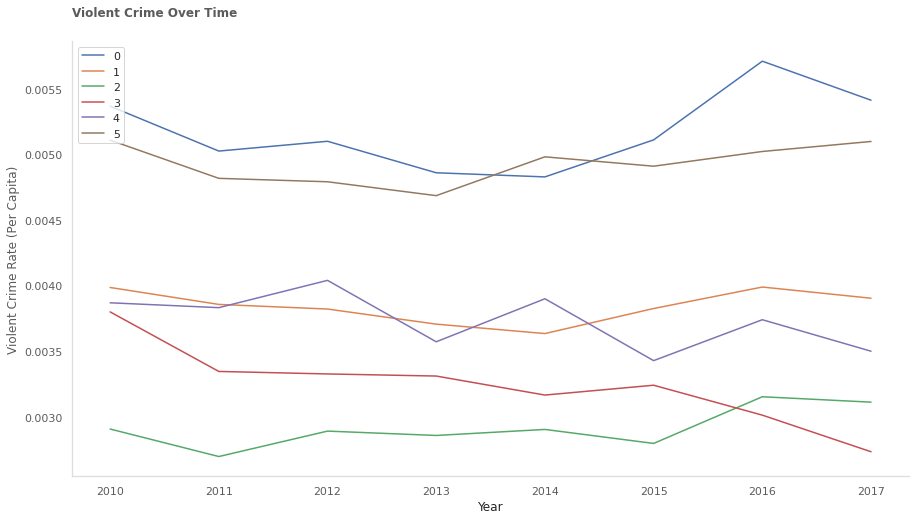

In [143]:
plt.figure(figsize=(15,8))


ax = sns.lineplot(data = res, x='Year',y='violent_crime',hue="Group",palette="deep")
ax.spines['bottom'].set_color('#dddddd')
ax.spines['left'].set_color('#dddddd')
sns.despine(left=False, bottom=False, right=True)
ax.tick_params(direction='out', length=6, width=2, colors="#5B5B5B")
               #grid_color='r', grid_alpha=0.5)
_ = ax.set_title('Violent Crime Over Time', color='#5B5B5B',loc='left',pad=25.0,fontweight="bold")
_ = ax.set_ylabel('Violent Crime Rate (Per Capita)',color='#5B5B5B')
plt.legend(loc='upper left')

Text(0, 0.5, 'Violent Crime Rate (Per Capita)')

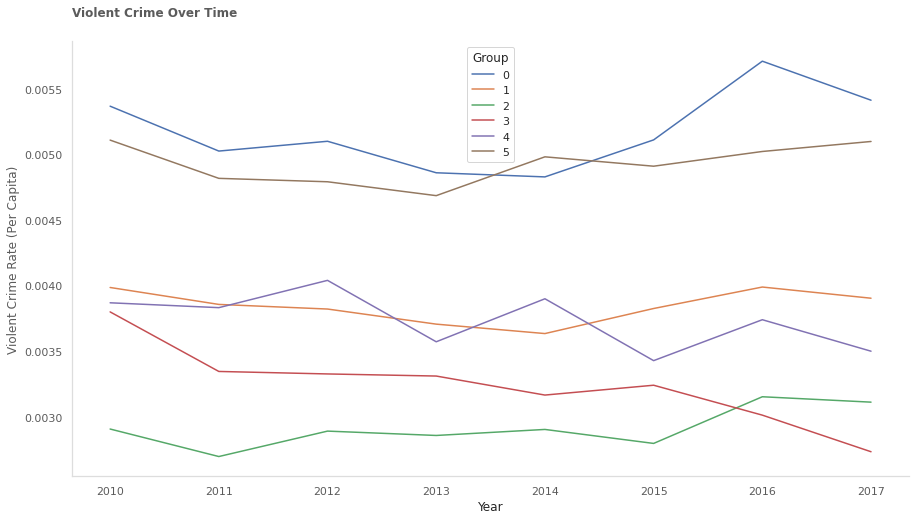

In [144]:
plt.figure(figsize=(15,8))


ax = sns.lineplot(data = res, x='Year',y='violent_crime',hue="Group",palette="deep")
ax.spines['bottom'].set_color('#dddddd')
ax.spines['left'].set_color('#dddddd')
sns.despine(left=False, bottom=False, right=True)
ax.tick_params(direction='out', length=6, width=2, colors="#5B5B5B")
               #grid_color='r', grid_alpha=0.5)
_ = ax.set_title('Violent Crime Over Time', color='#5B5B5B',loc='left',pad=25.0,fontweight="bold")
ax.set_ylabel('Violent Crime Rate (Per Capita)',color='#5B5B5B')

In [146]:
res = abs(test.drop(columns=['Labels','Group']).corr())>0.5
res2 = test.drop(columns=['Labels','Group']).corr()
res = res*1.0

tvars = res.columns.to_list()
for i in tvars:
    print('variable:',i,'\n')
    print(res2[i][res[i]>0].sort_values(ascending=False))
    print('-----------------------\n')

variable: violent_crime 

violent_crime     1.000000
property_crime    0.504558
Name: violent_crime, dtype: float64
-----------------------

variable: property_crime 

property_crime    1.000000
violent_crime     0.504558
Name: property_crime, dtype: float64
-----------------------

variable: rev_total 

rev_total          1.000000
social_services    0.725488
public_welfare     0.687200
police             0.614974
welfare_vendors    0.594178
welfare_other      0.578490
welfare_cash       0.506478
Name: rev_total, dtype: float64
-----------------------

variable: police 

police       1.000000
rev_total    0.614974
Name: police, dtype: float64
-----------------------

variable: education_services 

education_services    1.000000
education             0.998860
educ_elem_sec         0.995785
Name: education_services, dtype: float64
-----------------------

variable: education 

education             1.000000
education_services    0.998860
educ_elem_sec         0.997297
Name: education, dt

### Regression 

In [ ]:
from sklearn.model_selection import train_test_split

### Save Data

In [24]:
merged_df3['Group']=merged_df3['city_merge_name'].apply(apply_labels)

In [25]:
merged_df3

,city_merge_name,population,year,violent_crime,property_crime,rev_total,police,education_services,education,educ_higher,...,total_estimate_age_under_18_years,total_estimate_sex_male,total_estimate_age_65_years_and_over,percent_below_poverty_level_estimate_age_18_to_64_years,percent_race_one_race_asian,percent_race_one_race_black_or_african_american,percent_race_one_race_native_hawaiian_and_other_pacific_islander,percent_race_one_race_white,percent_hispanic_or_latino,Group
0,"Anchorage, AK",313181,2010,0.008129,0.035063,6036.69,433.95,2880.31,2846.29,0.0,...,0.263086,0.492334,0.0,8.6,6.5,4.9,1.7,71.1,6.7,1
1,"Anchorage, AK",310965,2011,0.007892,0.03302,5815.54,410.66,2787.14,2755.34,0.0,...,0.257335,0.486247,0.0,7.5,6.5,4.3,1.6,70.8,6.9,1
2,"Anchorage, AK",313529,2012,0.008111,0.036182,5378.15,446.75,2429.79,2398.01,0.0,...,0.254884,0.497295,0.0,7.9,7.4,5.0,1.6,70.3,7.2,1
3,"Anchorage, AK",314553,2013,0.007938,0.041478,5694.68,454.03,2471.81,2439.77,0.0,...,0.25188,0.495222,0.0,7.2,6.5,4.8,1.7,69.8,7.6,1
4,"Anchorage, AK",316696,2014,0.008437,0.039514,5735.87,468.5,2456.47,2430.38,0.0,...,0.250585,0.495168,0.0,8.5,7.4,4.5,1.7,69.3,7.9,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
873,"Cheyenne, WY",95635,2013,0.00207,0.027459,8445.96,339.58,2471.24,2401.25,0.0,...,0.236075,0.492952,0.000001,9.7,1.8,3.4,0.0,88.0,14.1,2
874,"Cheyenne, WY",96236,2014,0.0016,0.024326,8430.56,359.75,2541.09,2481.71,0.0,...,0.229789,0.483527,0.000001,11.8,1.0,3.3,0.0,84.9,14.3,2
875,"Cheyenne, WY",96943,2015,0.001774,0.025819,8849.32,470.45,2767.05,2703.34,0.0,...,0.231115,0.487878,0.000001,11.0,1.2,2.5,0.2,88.7,14.5,2
876,"Cheyenne, WY",97275,2016,0.002519,0.030213,8710.69,504.08,2665.2,2599.29,0.0,...,0.226884,0.496746,0.000001,9.8,1.2,2.7,0.4,90.6,14.6,2


In [26]:
merged_df3.to_csv('CleanData/CompleteMerged.csv',index=False)

In [39]:
from urllib.request import urlopen
import json
df = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/fips-unemp-16.csv",
                   dtype={"fips": str})

df

,fips,unemp
0,01001,5.3
1,01003,5.4
2,01005,8.6
3,01007,6.6
4,01009,5.5
...,...,...
3214,72145,13.9
3215,72147,10.6
3216,72149,20.2
3217,72151,16.9


In [59]:
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

In [45]:
counties

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'properties': {'GEO_ID': '0500000US01001',
    'STATE': '01',
    'COUNTY': '001',
    'NAME': 'Autauga',
    'LSAD': 'County',
    'CENSUSAREA': 594.436},
   'geometry': {'type': 'Polygon',
    'coordinates': [[[-86.496774, 32.344437],
      [-86.717897, 32.402814],
      [-86.814912, 32.340803],
      [-86.890581, 32.502974],
      [-86.917595, 32.664169],
      [-86.71339, 32.661732],
      [-86.714219, 32.705694],
      [-86.413116, 32.707386],
      [-86.411172, 32.409937],
      [-86.496774, 32.344437]]]},
   'id': '01001'},
  {'type': 'Feature',
   'properties': {'GEO_ID': '0500000US01009',
    'STATE': '01',
    'COUNTY': '009',
    'NAME': 'Blount',
    'LSAD': 'County',
    'CENSUSAREA': 644.776},
   'geometry': {'type': 'Polygon',
    'coordinates': [[[-86.577799, 33.765316],
      [-86.759144, 33.840617],
      [-86.953664, 33.815297],
      [-86.954305, 33.844862],
      [-86.96296, 33.844865],
      [-86.9

In [57]:
pd.DataFrame.from_dict(counties['features'],orient='index')

AttributeError: 'list' object has no attribute 'values'

In [60]:
import plotly.express as px

In [61]:
df = px.data.election()
geojson = px.data.election_geojson()

In [62]:
geojson

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'geometry': {'type': 'MultiPolygon',
    'coordinates': [[[[-73.6363215300962, 45.5759177646435],
       [-73.6362833815582, 45.5758266113331],
       [-73.6446417578686, 45.5658132919643],
       [-73.6453511352974, 45.5647725775888],
       [-73.648867564748, 45.5586898267402],
       [-73.6513170845065, 45.5545659435652],
       [-73.6515658357324, 45.5554439857955],
       [-73.6660837831645, 45.5596724837829],
       [-73.6706609041685, 45.5610978251999],
       [-73.6676019919116, 45.5632340862888],
       [-73.6645385824068, 45.5642716484367],
       [-73.663663123697, 45.5654269638586],
       [-73.663336397858, 45.5666288247853],
       [-73.6637764768649, 45.5678900619231],
       [-73.6625073244826, 45.5688479494114],
       [-73.6624620526633, 45.5708304456346],
       [-73.6620201425015, 45.5713925326191],
       [-73.6616100197742, 45.5737924780218],
       [-73.6612199500215, 45.5747171555678],
       [-7

In [63]:
df

,district,Coderre,Bergeron,Joly,total,winner,result,district_id
0,101-Bois-de-Liesse,2481,1829,3024,7334,Joly,plurality,101
1,102-Cap-Saint-Jacques,2525,1163,2675,6363,Joly,plurality,102
2,11-Sault-au-Récollet,3348,2770,2532,8650,Coderre,plurality,11
3,111-Mile-End,1734,4782,2514,9030,Bergeron,majority,111
4,112-DeLorimier,1770,5933,3044,10747,Bergeron,majority,112
5,113-Jeanne-Mance,1455,3599,2316,7370,Bergeron,plurality,113
6,12-Saint-Sulpice,3252,2521,2543,8316,Coderre,plurality,12
7,121-La Pointe-aux-Prairies,5456,1760,3330,10546,Coderre,majority,121
8,122-Pointe-aux-Trembles,4734,1879,2852,9465,Coderre,majority,122
9,123-Rivière-des-Prairies,5737,958,1656,8351,Coderre,majority,123


# Hypothesis Testing

In [91]:
test.head()

,city_merge_name,violent_crime,property_crime,rev_total,police,education_services,education,educ_higher,educ_elem_sec,social_services,...,total_estimate_age_65_years_and_over,percent_below_poverty_level_estimate_age_18_to_64_years,percent_race_one_race_asian,percent_race_one_race_black_or_african_american,percent_race_one_race_native_hawaiian_and_other_pacific_islander,percent_race_one_race_white,percent_hispanic_or_latino,Labels,Year,Group
0,"Anchorage, AK",0.008129,0.035063,6036.69,433.95,2880.31,2846.29,0.0,2846.29,103.90,...,1.825603e-07,8.6,6.5,4.9,1.7,71.1,6.7,5,2010,5
1,"Anchorage, AK",0.007892,0.033020,5815.54,410.66,2787.14,2755.34,0.0,2755.34,93.42,...,1.999156e-07,7.5,6.5,4.3,1.6,70.8,6.9,5,2011,5
2,"Anchorage, AK",0.008111,0.036182,5378.15,446.75,2429.79,2398.01,0.0,2398.01,96.70,...,2.031304e-07,7.9,7.4,5.0,1.6,70.3,7.2,5,2012,5
3,"Anchorage, AK",0.007938,0.041478,5694.68,454.03,2471.81,2439.77,0.0,2439.77,128.83,...,2.108275e-07,7.2,6.5,4.8,1.7,69.8,7.6,5,2013,5
4,"Anchorage, AK",0.008437,0.039514,5735.87,468.50,2456.47,2430.38,0.0,2430.38,81.63,...,2.261289e-07,8.5,7.4,4.5,1.7,69.3,7.9,5,2014,5


In [42]:
noDC = test[test['city_merge_name']!='Washington, DC']

In [43]:
noDC= noDC.rename(columns= {'percent_below_poverty_level_estimate_age_under_18_years':
                              'youth_poverty','percent_race_one_race_native_hawaiian_and_other_pacific_islander':'percent_hawaiian',
                               'total_estimate_mean_income_deficit_for_unrelated_individuals_(dollars)': 'income_deficit',
                               'total_estimate_educational_attainment_population_25_years_and_over':'educational_attainment', 'total_estimate_work_experience_population_16_years_and_over': 'estimate_employed', 'percent_race_one_race_black_or_african_american':'percent_black'})


In [44]:
noDC.columns

Index(['city_merge_name', 'violent_crime', 'property_crime', 'rev_total',
       'police', 'education_services', 'education', 'educ_higher',
       'educ_elem_sec', 'social_services', 'public_welfare', 'welfare_cash',
       'welfare_vendors', 'welfare_other', 'correction', 'parks_recreation',
       'housing_commdevt', 'per_capita_personal_income_dollars',
       'personal_income_thousands_of_dollars', 'educational_attainment',
       'percent_below_poverty_level_estimate_age_65_years_and_over',
       'percent_below_poverty_level_estimate_worked_full-time,_year-round_in_the_past_12_months',
       'total_estimate_age_18_to_64_years',
       'total_estimate_employment_status_civilian_labor_force_16_years_and_over',
       'total_estimate_population_for_whom_poverty_status_is_determined',
       'youth_poverty',
       'percent_below_poverty_level_estimate_population_for_whom_poverty_status_is_determined',
       'total_estimate_sex_female', 'estimate_employed', 'income_deficit',
     

In [45]:
noDC.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 793 entries, 0 to 877
Data columns (total 42 columns):
 #   Column                                                                                   Non-Null Count  Dtype  
---  ------                                                                                   --------------  -----  
 0   city_merge_name                                                                          793 non-null    object 
 1   violent_crime                                                                            793 non-null    float64
 2   property_crime                                                                           793 non-null    float64
 3   rev_total                                                                                793 non-null    float64
 4   police                                                                                   793 non-null    float64
 5   education_services                                              

In [46]:
import statsmodels.formula.api as sm

In [48]:
model1 = 'violent_crime ~ rev_total + public_welfare + welfare_cash + correction +housing_commdevt  + youth_poverty +  estimate_employed + income_deficit + total_estimate_age_under_18_years + total_estimate_sex_male + total_estimate_age_65_years_and_over + percent_race_one_race_asian + percent_black +percent_hawaiian + percent_race_one_race_white + percent_hispanic_or_latino ' #syntax dependent variable ~ independent variable
lm1   = sm.ols(formula = model1, data = noDC).fit()
print(lm1.summary())

                            OLS Regression Results                            
Dep. Variable:          violent_crime   R-squared:                       0.407
Model:                            OLS   Adj. R-squared:                  0.395
Method:                 Least Squares   F-statistic:                     33.35
Date:                Wed, 10 Feb 2021   Prob (F-statistic):           3.57e-77
Time:                        09:22:32   Log-Likelihood:                 4115.0
No. Observations:                 793   AIC:                            -8196.
Df Residuals:                     776   BIC:                            -8117.
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


In [104]:
lm1.params

Intercept                               4.662918e-03
rev_total                               1.699413e-07
public_welfare                         -2.784823e-06
welfare_cash                            3.215736e-06
correction                             -3.820413e-06
housing_commdevt                       -1.767486e-06
youth_poverty                           7.044471e-05
estimate_employed                      -1.596820e-02
income_deficit                         -2.441968e-07
total_estimate_age_under_18_years      -3.196742e-02
total_estimate_sex_male                 4.768845e-02
total_estimate_age_65_years_and_over   -1.251370e+03
percent_race_one_race_asian            -6.814841e-05
percent_black                           3.520207e-05
percent_hawaiian                        1.294790e-03
percent_race_one_race_white            -4.546245e-05
percent_hispanic_or_latino              1.482309e-05
dtype: float64

In [106]:
noDC['fits']= 4.662918e-03+ noDC['rev_total']*1.699413e-07
+ noDC['public_welfare']*-2.784823e-06 + noDC['welfare_cash']*3.215736e-06 
+noDC['correction']*-3.820413e-06 + noDC['housing_commdevt']*-1.767486e-06 
+ noDC['youth_poverty']*7.044471e-05 
+noDC['estimate_employed']*-1.596820e-02 +noDC["income_deficit"]*-2.441968e-07
+ noDC["total_estimate_age_under_18_years"]*-3.196742e-02+ noDC["total_estimate_sex_male"]*4.768845e-02
+ noDC["total_estimate_age_65_years_and_over"]*-1.251370e+03+noDC["percent_race_one_race_asian"]*-6.814841e-05
+ noDC["percent_black"]*3.520207e-05+noDC["percent_hawaiian"]*1.294790e-03+ noDC["percent_race_one_race_white"] * -4.546245e-05
+noDC["percent_hispanic_or_latino"] * 1.482309e-05






0      0.000099
1      0.000102
2      0.000107
3      0.000113
4      0.000117
         ...   
873    0.000209
874    0.000212
875    0.000215
876    0.000216
877    0.000219
Name: percent_hispanic_or_latino, Length: 793, dtype: float64

<AxesSubplot:xlabel='fits', ylabel='violent_crime'>

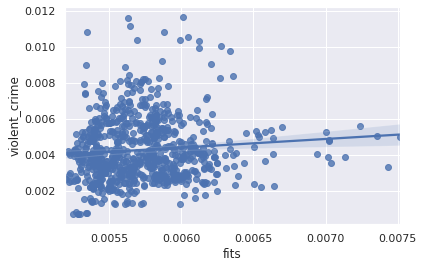

In [109]:
sns.regplot(data = noDC, y='violent_crime', x= 'fits', fit_reg = "True")


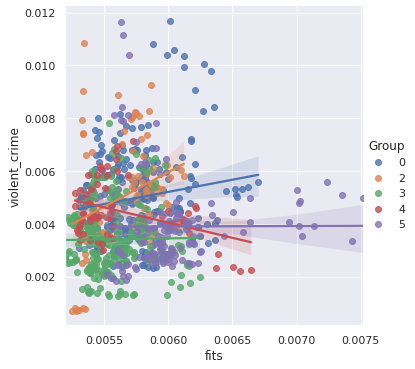

In [108]:
sns.lmplot(x = 'fits', y = 'violent_crime', data = noDC, hue = "Group")

<AxesSubplot:xlabel='violent_crime', ylabel='Density'>

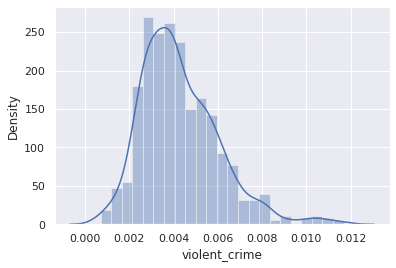

In [83]:
sns.distplot(noDC['violent_crime'])

In [87]:
noDC.columns

Index(['city_merge_name', 'violent_crime', 'property_crime', 'rev_total',
       'police', 'education_services', 'education', 'educ_higher',
       'educ_elem_sec', 'social_services', 'public_welfare', 'welfare_cash',
       'welfare_vendors', 'welfare_other', 'correction', 'parks_recreation',
       'housing_commdevt', 'per_capita_personal_income_dollars',
       'personal_income_thousands_of_dollars', 'educational_attainment',
       'percent_below_poverty_level_estimate_age_65_years_and_over',
       'percent_below_poverty_level_estimate_worked_full-time,_year-round_in_the_past_12_months',
       'total_estimate_age_18_to_64_years',
       'total_estimate_employment_status_civilian_labor_force_16_years_and_over',
       'total_estimate_population_for_whom_poverty_status_is_determined',
       'youth_poverty',
       'percent_below_poverty_level_estimate_population_for_whom_poverty_status_is_determined',
       'total_estimate_sex_female', 'estimate_employed', 'income_deficit',
     

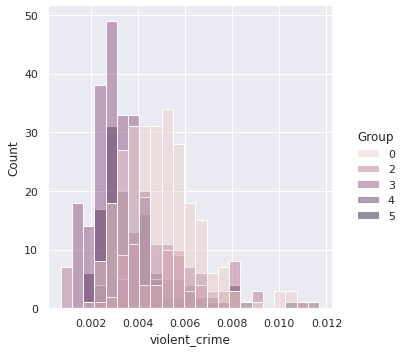

In [94]:
sns.displot(data=noDC, x="violent_crime", hue="Group")

In [ ]:
model1 = 'violent_crime ~ rev_total + public_welfare + welfare_cash + correction +housing_commdevt  + youth_poverty +  estimate_employed + income_deficit + total_estimate_age_under_18_years + total_estimate_sex_male + total_estimate_age_65_years_and_over + percent_race_one_race_asian + percent_black +percent_hawaiian + percent_race_one_race_white + percent_hispanic_or_latino ' #syntax dependent variable ~ independent variable
lm1   = sm.ols(formula = model1, data = noDC).fit()
print(lm1.summary())

In [123]:
noDC.violent_crime.describe()

count    793.000000
mean       0.004283
std        0.001754
min        0.000702
25%        0.002997
50%        0.003981
75%        0.005297
max        0.011683
Name: violent_crime, dtype: float64

In [124]:
high = 0.005297
low = 0.002997
crimelvl = ['']
for i in noDC['crime_lvl']:
    if i > high:
        lvl = 'high'
    elif i < low:
        lvl = 'low'
    else: lvl = 'avg'
    crimelvl.append(lvl)
    
noDC['crime_lvl'] = crimelvl

In [125]:
mod = ols('violent_crime ~ crime_lvl', data=noDC).fit()  
aov_table = sm.stats.anova_lm(mod, typ=2)
aov_table

,sum_sq,df,F,PR(>F)
crime_lvl,0.001855,2.0,1259.552055,1.892696e-246
Residual,0.000582,790.0,NaN,NaN


# Testing across High and Low levels of crime rates

In [135]:
noDC.groupby(['crime_lvl'])['police','youth_poverty','education_services','social_services','income_deficit'].mean()

,police,youth_poverty,education_services,social_services,income_deficit
crime_lvl,,,,,
avg,380.423838,20.840404,1803.736768,525.609268,6659.303030
high,413.892060,23.379397,1750.703266,709.018643,6774.236181
low,366.353737,16.962626,1977.733485,680.221667,6532.888889


## Which features differ significantly across levels of crime

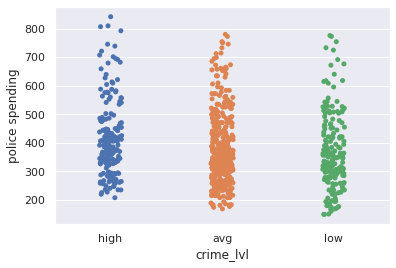

In [139]:
ax = sns.stripplot(x="crime_lvl", y="police", data=noDC)
ax = sns.stripplot(x="crime_lvl", y="youth_poverty", data=noDC)
plt.ylabel('police spending')
plt.show()

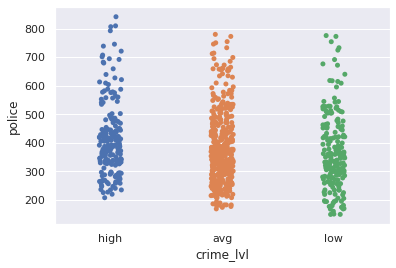

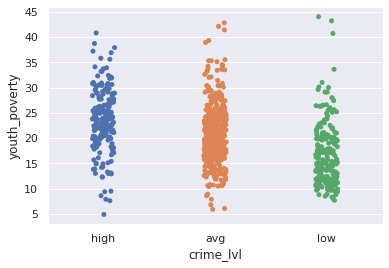

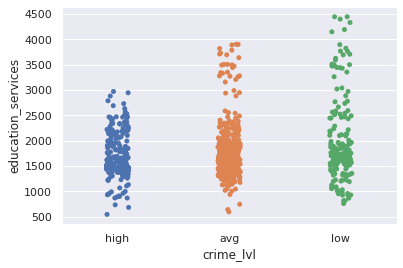

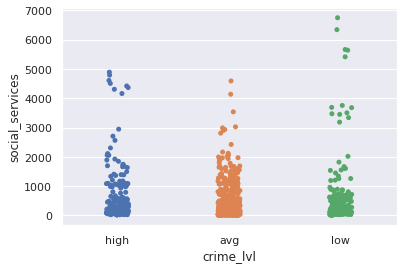

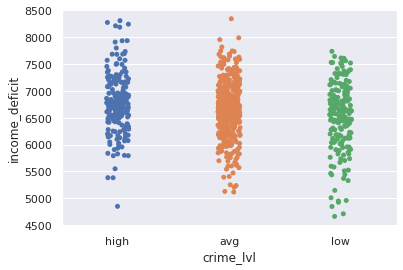

In [143]:
gbo = noDC.groupby(['crime_lvl'])['police','youth_poverty','education_services','social_services','income_deficit'].mean()
for i in gbo.columns:
    ax = sns.stripplot(x="crime_lvl", y=i, data=noDC)
    plt.ylabel(i)
    plt.show()

In [129]:
from scipy import stats
gb = noDC.groupby(['crime_lvl'])
group_names = noDC["crime_lvl"].unique()
print("\t\t\tstatistic\t\tpvalue")
for i in range(len(group_names)):
  for j in range(i+1, len(group_names)):
    group1 = gb[["youth_poverty"]].get_group(group_names[i]).astype('float')
    group2 = gb[["youth_poverty"]].get_group(group_names[j]).astype('float')
    stat, pvalue = stats.ttest_ind(group1, group2, equal_var = False)
    print(str(group_names[i]) + " vs. " + str(group_names[j]) + "\t" + str(stat[0]) + "\t" + str(pvalue[0]))

			statistic		pvalue
high vs. avg	4.828870456822753	1.995025258353003e-06
high vs. low	10.276734014417308	4.125645746161682e-22
avg vs. low	7.250336303355839	2.452014617022981e-12


### Poverty rates are significantly different across all levels, with High crime having the highest poverty levels.

In [130]:
gb = noDC.groupby(['crime_lvl'])
group_names = noDC["crime_lvl"].unique()
print("\t\t\tstatistic\t\tpvalue")
for i in range(len(group_names)):
  for j in range(i+1, len(group_names)):
    group1 = gb[["police"]].get_group(group_names[i]).astype('float')
    group2 = gb[["police"]].get_group(group_names[j]).astype('float')
    stat, pvalue = stats.ttest_ind(group1, group2, equal_var = False)
    print(str(group_names[i]) + " vs. " + str(group_names[j]) + "\t" + str(stat[0]) + "\t" + str(pvalue[0]))

			statistic		pvalue
high vs. avg	3.001411185929406	0.002860595052323495
high vs. low	3.622406926773097	0.0003299653440514239
avg vs. low	1.2407635618698982	0.215460848341233


### Police spending is significantly different between high and average crime levels, but not different btw low and average. 

In [136]:
gb = noDC.groupby(['crime_lvl'])
group_names = noDC["crime_lvl"].unique()
print("\t\t\tstatistic\t\tpvalue")
for i in range(len(group_names)):
  for j in range(i+1, len(group_names)):
    group1 = gb[['education_services']].get_group(group_names[i]).astype('float')
    group2 = gb[['education_services']].get_group(group_names[j]).astype('float')
    stat, pvalue = stats.ttest_ind(group1, group2, equal_var = False)
    print(str(group_names[i]) + " vs. " + str(group_names[j]) + "\t" + str(stat[0]) + "\t" + str(pvalue[0]))

			statistic		pvalue
high vs. avg	-1.214279218896744	0.225253929108514
high vs. low	-3.4384122555383305	0.0006633639706338035
avg vs. low	-2.7300894059299736	0.006709407643099424


### Education spending is different between high /low and avg/low but now high/avg

In [137]:
gb = noDC.groupby(['crime_lvl'])
group_names = noDC["crime_lvl"].unique()
print("\t\t\tstatistic\t\tpvalue")
for i in range(len(group_names)):
  for j in range(i+1, len(group_names)):
    group1 = gb[['social_services']].get_group(group_names[i]).astype('float')
    group2 = gb[['social_services']].get_group(group_names[j]).astype('float')
    stat, pvalue = stats.ttest_ind(group1, group2, equal_var = False)
    print(str(group_names[i]) + " vs. " + str(group_names[j]) + "\t" + str(stat[0]) + "\t" + str(pvalue[0]))


			statistic		pvalue
high vs. avg	2.4023559777971317	0.016913661080976094
high vs. low	0.2741537785209232	0.784112740623564
avg vs. low	-1.7982673664354907	0.07326269342648264


Social services are only significantly different between the high/avg levels

In [138]:
gb = noDC.groupby(['crime_lvl'])
group_names = noDC["crime_lvl"].unique()
print("\t\t\tstatistic\t\tpvalue")
for i in range(len(group_names)):
  for j in range(i+1, len(group_names)):
    group1 = gb[['income_deficit']].get_group(group_names[i]).astype('float')
    group2 = gb[['income_deficit']].get_group(group_names[j]).astype('float')
    stat, pvalue = stats.ttest_ind(group1, group2, equal_var = False)
    print(str(group_names[i]) + " vs. " + str(group_names[j]) + "\t" + str(stat[0]) + "\t" + str(pvalue[0]))

			statistic		pvalue
high vs. avg	2.4365388622834994	0.015281518401826035
high vs. low	4.088610518209826	5.2773148476749156e-05
avg vs. low	2.442574087693247	0.01508797066276182


### Income deficit is different amongst all levels, with high crime areas having the highest income deficit

In [30]:
groupdf = test.groupby('Group')

In [32]:
groups = list(test.Group.unique()) 

# Compare amongst group levels

In [30]:
import statsmodels.api as sm
from statsmodels.formula.api import ols
import statsmodels
mod = ols('violent_crime ~ Group', data=test).fit()  
aov_table = sm.stats.anova_lm(mod, typ=2)
aov_table

,sum_sq,df,F,PR(>F)
Group,0.000113,1.0,38.604643,8.346054e-10
Residual,0.002333,799.0,NaN,NaN


In [31]:
mod = ols('percent_below_poverty_level_estimate_age_18_to_64_years ~ Group', data=test).fit()  
aov_table = sm.stats.anova_lm(mod, typ=2)
aov_table

,sum_sq,df,F,PR(>F)
Group,846.941333,1.0,65.881927,1.804970e-15
Residual,10271.498692,799.0,NaN,NaN


In [32]:
mod = ols('police ~ Group', data=test).fit()  
aov_table = sm.stats.anova_lm(mod, typ=2)
aov_table

,sum_sq,df,F,PR(>F)
Group,1.354402e+05,1.0,6.811405,0.009227
Residual,1.588757e+07,799.0,NaN,NaN


In [33]:
test.groupby(['Group']).mean()


,violent_crime,property_crime,rev_total,police,education_services,education,educ_higher,educ_elem_sec,social_services,public_welfare,...,total_estimate_age_under_18_years,total_estimate_sex_male,total_estimate_age_65_years_and_over,percent_below_poverty_level_estimate_age_18_to_64_years,percent_race_one_race_asian,percent_race_one_race_black_or_african_american,percent_race_one_race_native_hawaiian_and_other_pacific_islander,percent_race_one_race_white,percent_hispanic_or_latino,Labels
Group,,,,,,,,,,,,,,,,,,,,,
0,0.003242,0.021271,20256.158750,967.331250,4351.036250,4223.313750,261.918750,3961.396250,6431.268750,5324.697500,...,0.229539,0.476358,1.825922e-08,7.712500,9.750000,25.450000,0.075000,54.975000,14.837500,0.000000
1,0.003976,0.025716,8016.961912,473.817059,2635.768897,2581.080368,39.440074,2541.640515,756.397647,264.982353,...,0.220160,0.476081,1.863451e-07,11.575735,8.364706,9.738235,0.244118,70.619118,15.525000,1.419118
2,0.005100,0.034398,5957.182169,345.541084,1820.208795,1795.274699,0.198072,1795.076627,893.164940,264.349759,...,0.273916,0.482730,1.853332e-07,18.549398,4.834940,4.577108,0.283133,74.596386,48.762651,2.180723
3,0.003324,0.029647,5411.404856,315.573457,1703.481029,1648.947284,9.157613,1639.789671,398.684609,106.612469,...,0.229503,0.480471,4.376895e-07,12.203704,2.466255,6.925514,0.151029,83.502881,7.763374,3.378601
4,0.004451,0.033277,5788.834769,322.040308,1650.732000,1607.993077,19.542462,1588.450615,946.489385,60.780308,...,0.219735,0.440344,1.985678e-07,15.438462,2.383077,22.935385,0.030769,70.055385,6.246154,4.061538
5,0.005021,0.033124,6404.591241,431.633083,1592.013421,1545.376466,6.606579,1538.769887,558.326805,92.272707,...,0.231345,0.479499,1.837949e-07,15.313534,3.353759,18.882707,0.103008,71.143985,13.468797,4.545113


In [35]:
from scipy import stats
gb = test.groupby(['Group'])
group_names = test["Group"].unique()
print("\t\t\tstatistic\t\tpvalue")
for i in range(len(group_names)):
  for j in range(i+1, len(group_names)):
    group1 = gb[["violent_crime"]].get_group(group_names[i]).astype('float')
    group2 = gb[["violent_crime"]].get_group(group_names[j]).astype('float')
    stat, pvalue = stats.ttest_ind(group1, group2, equal_var = False)
    print(str(group_names[i]) + " vs. " + str(group_names[j]) + "\t" + str(stat[0]) + "\t" + str(pvalue[0]))

			statistic		pvalue
1 vs. 3	3.763927854416113	0.0002166886319884016
1 vs. 5	-5.714381674895781	3.104251751447194e-08
1 vs. 4	-2.2940835340576267	0.022914760587116688
1 vs. 2	-3.933758332129808	0.00012857240255669151
1 vs. 0	3.916026147743581	0.0002604885760326711
3 vs. 5	-13.196635838652368	2.854854251644578e-34
3 vs. 4	-6.98253803781982	2.271548958718453e-10
3 vs. 2	-6.977933475608416	3.2025931694052073e-10
3 vs. 0	0.6059581481329522	0.5525841189321345
5 vs. 4	3.313631818855582	0.0011769987678933447
5 vs. 2	-0.30321347466623666	0.7622918161693004
5 vs. 0	12.095339135753713	1.1878982527864506e-11
4 vs. 2	-2.3261305954377285	0.02158591419259638
4 vs. 0	6.849430982456581	3.699640425446135e-08
2 vs. 0	7.027870816735988	6.115215118514362e-10


## Violent crime rates are not significantly different between groups 3-0, 5-2

In [36]:
gb = test.groupby(['Group'])
group_names = test["Group"].unique()
print("\t\t\tstatistic\t\tpvalue")
for i in range(len(group_names)):
  for j in range(i+1, len(group_names)):
    group1 = gb[["percent_below_poverty_level_estimate_age_18_to_64_years"]].get_group(group_names[i])
    group2 = gb[["percent_below_poverty_level_estimate_age_18_to_64_years"]].get_group(group_names[j])
    stat, pvalue = stats.ttest_ind(group1, group2, equal_var = False)
    print(str(group_names[i]) + " vs. " + str(group_names[j]) + "\t" + str(stat[0]) + "\t" + str(pvalue[0]))

			statistic		pvalue
1 vs. 3	-2.2529391760631317	0.0249716018075785
1 vs. 5	-13.15551870876177	5.882799705269474e-32
1 vs. 4	-9.32969491055061	1.156156904802626e-15
1 vs. 2	-14.767793552862143	3.6264081699042863e-29
1 vs. 0	16.653838194637903	1.1241163730812348e-32
3 vs. 5	-12.03025405749598	1.6861559117835244e-29
3 vs. 4	-8.15049109986573	1.1455042175360068e-12
3 vs. 2	-13.877576870859821	3.685118420256197e-26
3 vs. 0	22.482019777972337	1.151214718657627e-44
5 vs. 4	-0.31178652901033693	0.7558353184542748
5 vs. 2	-7.025804680395218	1.5518202119493206e-10
5 vs. 0	36.68022402870126	1.0669288130629443e-71
4 vs. 2	-5.653319022063534	8.03488307960154e-08
4 vs. 0	21.134751003165892	4.6470135270738985e-32
2 vs. 0	25.181113500501116	7.463101961685691e-42


## poverty rates are not different between groups 5 and 4

In [37]:
gb = test.groupby(['Group'])
group_names = test["Group"].unique()
print("\t\t\tstatistic\t\tpvalue")
for i in range(len(group_names)):
  for j in range(i+1, len(group_names)):
    group1 = gb[["police"]].get_group(group_names[i])
    group2 = gb[["police"]].get_group(group_names[j])
    stat, pvalue = stats.ttest_ind(group1, group2, equal_var = False)
    print(str(group_names[i]) + " vs. " + str(group_names[j]) + "\t" + str(stat[0]) + "\t" + str(pvalue[0]))

			statistic		pvalue
1 vs. 3	11.561860812338123	4.409387220849357e-24
1 vs. 5	2.919922376670809	0.0038317697827809586
1 vs. 4	9.912439026205188	4.651747900134957e-19
1 vs. 2	8.097165069359532	4.049905575352663e-14
1 vs. 0	-18.02393773537665	1.8171870028132283e-09
3 vs. 5	-11.872392319248537	9.314694810816803e-29
3 vs. 4	-0.5871746004139539	0.5581346003117093
3 vs. 2	-2.5526849035215258	0.011711220743322261
3 vs. 0	-25.832320925244545	6.561516728576867e-09
5 vs. 4	9.174679168806641	1.8244003362878684e-16
5 vs. 2	6.823071574105583	1.223790776272841e-10
5 vs. 0	-20.884353684157354	1.4814920867359304e-08
4 vs. 2	-1.728075453611467	0.08609149989400781
4 vs. 0	-24.678849716638236	1.2248878805411463e-09
2 vs. 0	-23.49784497788776	9.335492524244222e-10


## Police spending is not different between  3 and 4, 4 and 2

In [116]:
test[test['Group'] == 0]

,city_merge_name,violent_crime,property_crime,rev_total,police,education_services,education,educ_higher,educ_elem_sec,social_services,...,total_estimate_age_65_years_and_over,percent_below_poverty_level_estimate_age_18_to_64_years,percent_race_one_race_asian,percent_race_one_race_black_or_african_american,percent_race_one_race_native_hawaiian_and_other_pacific_islander,percent_race_one_race_white,percent_hispanic_or_latino,Labels,Year,Group
184,"Washington, DC",0.003800,0.025506,19051.09,1079.86,4719.30,4517.50,296.03,4221.47,6252.47,...,1.681199e-08,7.8,9.2,25.8,0.1,55.8,13.8,0,2010,0
185,"Washington, DC",0.003346,0.023860,20232.45,1064.41,4358.31,4218.33,301.98,3916.36,6206.64,...,1.711028e-08,7.7,9.4,25.8,0.0,56.0,14.1,0,2011,0
186,"Washington, DC",0.003327,0.022821,19607.89,971.41,4199.41,4086.55,293.76,3792.79,6096.90,...,1.742847e-08,7.8,9.5,25.3,0.1,55.6,14.5,0,2012,0
187,"Washington, DC",0.003311,0.021691,20557.49,927.95,4286.93,4187.29,263.10,3924.20,6421.14,...,1.804635e-08,7.7,9.5,25.5,0.1,56.1,14.7,0,2013,0
188,"Washington, DC",0.003166,0.021116,20972.68,962.52,4212.99,4107.05,240.44,3866.61,6230.61,...,1.850781e-08,8.1,9.9,25.2,0.1,55.8,15.1,0,2014,0
189,"Washington, DC",0.003241,0.019292,21060.29,912.67,4365.06,4252.81,278.16,3974.65,6733.37,...,1.886347e-08,7.6,10.1,25.3,0.1,53.8,15.2,0,2015,0
190,"Washington, DC",0.003013,0.018429,19917.29,897.42,4296.92,4183.16,240.40,3942.76,6822.65,...,1.934513e-08,7.8,10.1,25.4,0.1,53.9,15.5,0,2016,0
191,"Washington, DC",0.002734,0.017454,20650.09,922.41,4369.37,4233.82,181.48,4052.33,6686.37,...,1.996021e-08,7.2,10.3,25.3,0.0,52.8,15.8,0,2017,0


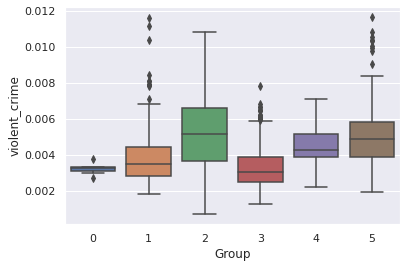

In [38]:
ax = sns.boxplot(x="Group", y="violent_crime", data=test)

## Lets compare groups 3 and 5. 3 has lowest violent crime rate, 5 has the highest

In [52]:
compdf = test[(test['Group']== 3) | (test['Group']== 5)]

In [67]:
compdf.shape

(509, 43)

In [75]:
compdf.columns

Index(['city_merge_name', 'violent_crime', 'property_crime', 'rev_total',
       'police', 'education_services', 'education', 'educ_higher',
       'educ_elem_sec', 'social_services', 'public_welfare', 'welfare_cash',
       'welfare_vendors', 'welfare_other', 'correction', 'parks_recreation',
       'housing_commdevt', 'per_capita_personal_income_dollars',
       'personal_income_thousands_of_dollars', 'educational_attainment',
       'percent_below_poverty_level_estimate_age_65_years_and_over',
       'percent_below_poverty_level_estimate_worked_full-time,_year-round_in_the_past_12_months',
       'total_estimate_age_18_to_64_years',
       'total_estimate_employment_status_civilian_labor_force_16_years_and_over',
       'total_estimate_population_for_whom_poverty_status_is_determined',
       'youth_poverty',
       'percent_below_poverty_level_estimate_population_for_whom_poverty_status_is_determined',
       'total_estimate_sex_female',
       'total_estimate_work_experience_popul

In [73]:
compdf= compdf.rename(columns= {'percent_below_poverty_level_estimate_age_under_18_years':
                              'youth_poverty','percent_race_one_race_native_hawaiian_and_other_pacific_islander':'percent_hawaiian',
                               'total_estimate_mean_income_deficit_for_unrelated_individuals_(dollars)': 'income_deficit',
                               'total_estimate_educational_attainment_population_25_years_and_over':'educational_attainment'})


In [107]:
betterXfeat = ["police", "youth_poverty", 'social_services', 'public_welfare', 'educational_attainment', 'per_capita_personal_income_dollars']
Xdf = compdf.loc[:, compdf.columns.isin(betterXfeat)]
#Xdf = compdf['police']
Ydf = compdf['violent_crime']

## Repeating the regression test with normalizing the data first

In [108]:
from sklearn.preprocessing import RobustScaler
Xstd = RobustScaler().fit_transform(Xdf)

In [111]:
Xstd

array([[ 1.        , -0.14840037, -0.43597263, ...,  0.29831144,
        -1.49526782, -1.81818182],
       [ 1.        , -0.0252536 , -0.44515175, ...,  0.89005629,
        -1.40537678, -1.03030303],
       [ 1.        , -1.01134993, -0.42042772, ...,  0.89030644,
        -1.4803886 , -2.09090909],
       ...,
       [ 1.        ,  0.80017025,  7.65624776, ...,  0.72095059,
        -0.10502972, -0.3030303 ],
       [ 1.        ,  1.03873165,  8.38256682, ...,  0.54258912,
         0.55338231, -1.42424242],
       [ 1.        ,  0.04398099,  7.78098848, ...,  0.73233271,
         0.5203513 , -1.57575758]])

In [109]:
Xstd = add_constant(Xstd)
mod = sm.OLS(Ydf, Xstd)

res = mod.fit()

print(res.summary())

                            OLS Regression Results                            
Dep. Variable:          violent_crime   R-squared:                       0.356
Model:                            OLS   Adj. R-squared:                  0.348
Method:                 Least Squares   F-statistic:                     46.28
Date:                Thu, 04 Feb 2021   Prob (F-statistic):           4.16e-45
Time:                        02:35:22   Log-Likelihood:                 2638.5
No. Observations:                 509   AIC:                            -5263.
Df Residuals:                     502   BIC:                            -5233.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0043   6.85e-05     62.360      0.0

In [79]:
import statsmodels.api as sm
from statsmodels.api import add_constant

Xdf = add_constant(Xdf)
mod = sm.OLS(Ydf, Xdf)

res = mod.fit()

print(res.summary())

                            OLS Regression Results                            
Dep. Variable:          violent_crime   R-squared:                       0.356
Model:                            OLS   Adj. R-squared:                  0.348
Method:                 Least Squares   F-statistic:                     46.28
Date:                Mon, 01 Feb 2021   Prob (F-statistic):           4.16e-45
Time:                        03:20:02   Log-Likelihood:                 2638.5
No. Observations:                 509   AIC:                            -5263.
Df Residuals:                     502   BIC:                            -5233.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

In [80]:
compdf['fits']=-0.0044+compdf['police']*3.208e-06 + compdf['social_services']*2.13e-07 + compdf['public_welfare']*-3.118e-06 + compdf['youth_poverty']* 0.002 + compdf['per_capita_personal_income_dollars']*5.502e-08 + compdf['educational_attainment']*-0.0101

<AxesSubplot:xlabel='violent_crime', ylabel='fits'>

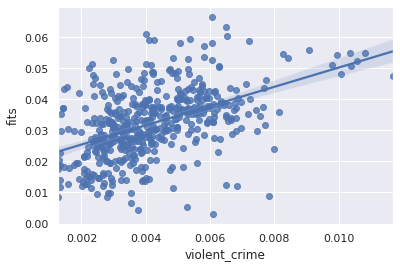

In [81]:
sns.regplot(data = compdf, x='violent_crime', y= 'fits', fit_reg = "True")

# Question... what does "1 unit of change" mean for each feature. The coefficient for poverty and educational attainment are orders of magnitude higher than other variables. This would indicate a change in those variables result in larger impacts on crime rates.

In [ ]:
model1 = 'violent~age' # syntax dependent variable ~ independent variable
lm1   = sm.ols(formula = model1, data = Data).fit()
print(lm1.summary())

### lets analyze groups 3 and 4. These groups have police spending that do not differ. Lets compare crime rates

In [83]:
poldf = test[(test['Group']== 3) | (test['Group']== 4)]
poldf.shape

(308, 42)

In [84]:
poldf= poldf.rename(columns= {'percent_below_poverty_level_estimate_age_under_18_years':
                              'youth_poverty','percent_race_one_race_native_hawaiian_and_other_pacific_islander':'percent_hawaiian',
                               'total_estimate_mean_income_deficit_for_unrelated_individuals_(dollars)': 'income_deficit',
                               'total_estimate_educational_attainment_population_25_years_and_over':'educational_attainment'})


In [85]:
poldf.head()

,city_merge_name,violent_crime,property_crime,rev_total,police,education_services,education,educ_higher,educ_elem_sec,social_services,...,total_estimate_age_65_years_and_over,percent_below_poverty_level_estimate_age_18_to_64_years,percent_race_one_race_asian,percent_race_one_race_black_or_african_american,percent_hawaiian,percent_race_one_race_white,percent_hispanic_or_latino,Labels,Year,Group
8,"Fairbanks, AK",0.007831,0.040541,5175.37,336.73,2689.78,2627.57,0.0,2627.57,54.71,...,6.044027e-07,6.8,3.1,4.2,0.4,78.1,5.8,3,2010,3
9,"Fairbanks, AK",0.005607,0.040767,5456.08,354.09,2632.38,2570.75,0.0,2570.75,50.86,...,6.820022e-07,9.5,2.5,4.6,0.3,76.3,6.3,3,2011,3
10,"Fairbanks, AK",0.005289,0.044765,5102.97,215.08,2403.69,2348.88,0.0,2348.88,61.23,...,7.157412e-07,7.3,2.4,4.9,0.5,77.6,6.8,3,2012,3
11,"Fairbanks, AK",0.006822,0.041133,5385.34,292.75,2420.57,2358.04,0.0,2358.04,66.17,...,7.482721e-07,7.8,3.4,3.9,0.2,77.6,7.7,3,2013,3
12,"Fairbanks, AK",0.006482,0.040073,5713.46,263.51,2371.46,2300.65,0.0,2300.65,41.09,...,7.968446e-07,10.9,2.5,4.6,0.6,75.8,7.7,3,2014,3


In [101]:
poldf = poldf.drop(columns = ['Group','Labels','Year'])

Hypothesis Testing

In [86]:
poldf.violent_crime.describe()

count    308.000000
mean       0.003562
std        0.001314
min        0.001274
25%        0.002656
50%        0.003322
75%        0.004252
max        0.007831
Name: violent_crime, dtype: float64

In [87]:
#based on the distribution, lets take the 75th percentile as high crime and the bottom 25th percentile as low crime.
#For this test, lets assume data between the high and low as avg.
high = 0.004252
low = 0.002656
crimelvl = []
for i in poldf['violent_crime']:
    if i > high:
        lvl = 'high'
    elif i < low:
        lvl = 'low'
    else: lvl = 'avg'
    crimelvl.append(lvl)

In [89]:
poldf['crime_lvl'] = crimelvl

In [90]:
import statsmodels.api as sm
import statsmodels
from scipy import stats
from pingouin import pairwise_ttests #this is for performing the pairwise tests

highcrimepolice=poldf[poldf.crime_lvl=="high"].police
lowcrimepolice=poldf[poldf.crime_lvl=="low"].police

statistic, pvalue = stats.ttest_ind(highcrimepolice,lowcrimepolice, equal_var=False)
print(pvalue)

0.595406248575281


### We see from this test if we subset groups 3 and 4 into high vs low crime rates, mean police spending is not different. Lets what is significant

In [93]:
featlist = list(poldf.iloc[:,1:39].columns)
featlist

['violent_crime',
 'property_crime',
 'rev_total',
 'police',
 'education_services',
 'education',
 'educ_higher',
 'educ_elem_sec',
 'social_services',
 'public_welfare',
 'welfare_cash',
 'welfare_vendors',
 'welfare_other',
 'correction',
 'parks_recreation',
 'housing_commdevt',
 'per_capita_personal_income_dollars',
 'personal_income_thousands_of_dollars',
 'educational_attainment',
 'percent_below_poverty_level_estimate_age_65_years_and_over',
 'percent_below_poverty_level_estimate_worked_full-time,_year-round_in_the_past_12_months',
 'total_estimate_age_18_to_64_years',
 'total_estimate_employment_status_civilian_labor_force_16_years_and_over',
 'total_estimate_population_for_whom_poverty_status_is_determined',
 'youth_poverty',
 'percent_below_poverty_level_estimate_population_for_whom_poverty_status_is_determined',
 'total_estimate_sex_female',
 'total_estimate_work_experience_population_16_years_and_over',
 'income_deficit',
 'total_estimate_age_under_18_years',
 'total_estim

In [94]:
for i in featlist:
    a = poldf[poldf.crime_lvl=="high"][i].astype('float')
    b = poldf[poldf.crime_lvl=="low"][i].astype('float')
    statistic, pvalue = stats.ttest_ind(a, b, equal_var=False)
    if (pvalue) < 0.05:
        print(i, pvalue)

violent_crime 1.70787315648554e-55
property_crime 3.050248621153545e-14
social_services 0.006759476039543186
public_welfare 5.212942056595524e-05
welfare_vendors 0.016499221254332057
welfare_other 0.00023196940642798388
parks_recreation 0.000508581687987611
housing_commdevt 0.0032055451781401708
educational_attainment 0.0019175789202612208
percent_below_poverty_level_estimate_age_65_years_and_over 0.010454961047109107
total_estimate_employment_status_civilian_labor_force_16_years_and_over 9.871158462086536e-08
youth_poverty 0.00022371104825874487
percent_below_poverty_level_estimate_population_for_whom_poverty_status_is_determined 0.00120367666363547
total_estimate_work_experience_population_16_years_and_over 0.008520953107313219
income_deficit 0.0020955347496297324
total_estimate_age_under_18_years 0.0010439139877314709
total_estimate_age_65_years_and_over 0.0021104797845876333
percent_below_poverty_level_estimate_age_18_to_64_years 0.021467329736777008
percent_race_one_race_black_or_

In [95]:
betterfeat = ["youth_poverty", 'social_services', 'public_welfare', 'educational_attainment', 'income_deficit']
Xdf = poldf.loc[:, poldf.columns.isin(betterfeat)]
#Xdf = compdf['police']
Ydf = poldf['violent_crime']

In [96]:
Xdf = add_constant(Xdf)
mod = sm.OLS(Ydf, Xdf)

res = mod.fit()

print(res.summary())

                            OLS Regression Results                            
Dep. Variable:          violent_crime   R-squared:                       0.218
Model:                            OLS   Adj. R-squared:                  0.205
Method:                 Least Squares   F-statistic:                     16.82
Date:                Tue, 02 Feb 2021   Prob (F-statistic):           1.16e-14
Time:                        02:43:49   Log-Likelihood:                 1644.7
No. Observations:                 308   AIC:                            -3277.
Df Residuals:                     302   BIC:                            -3255.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [105]:
poldf.corr().sort_values(by ="violent_crime", ascending = False)['violent_crime']

violent_crime                                                                              1.000000
property_crime                                                                             0.427971
percent_race_one_race_black_or_african_american                                            0.347328
total_estimate_age_under_18_years                                                          0.276521
youth_poverty                                                                              0.235177
percent_below_poverty_level_estimate_population_for_whom_poverty_status_is_determined      0.181279
income_deficit                                                                             0.162087
percent_below_poverty_level_estimate_age_65_years_and_over                                 0.117668
percent_below_poverty_level_estimate_age_18_to_64_years                                    0.102973
percent_below_poverty_level_estimate_worked_full-time,_year-round_in_the_past_12_months    0.051989
